## **Digital Image Processing**
------
### Author: **_Elio David Triana Rodriguez_**
### University: Federal University of Espírito Santo
### First List - May 2024
------
#### **First Point**:
Write a program that automatically counts the number of rice grains (rice.tif image), also informing the area (number of pixels) of each one. Your program must provide the area of each rice. Return the area mean value and standard deviation. Attention: any object that touches the contours of the image must be discarded. Note that you will have to binarize the image: generate the histogram and choose a threshold value to map, above it, to gray level 255; and below or equal to it, at gray level 0. Pay attention that the lighting in the image is not uniform, do some procedure to minimize the influence of lighting before binarizing.

1. The libraries for code processing are imported. According to the information in the activity document, advanced image processing libraries will **NOT** be used.

In [181]:
import numpy as np
import matplotlib.pyplot as plt
import skimage.io as sk_
import os

2. The workspace and the path where the code will be processed are designated.

In [182]:
origin_path = os.getcwd()
# This is relative path of work. Change if you work with another directory
name_dir = "./img_folder/"

3. Develop a function that organizes images by defining the path and verifying if the files were loaded correctly.

In [183]:
# Input parameter for this, is the path of workspace
def get_listFiles(origin_path: str = origin_path) -> dict:
    dic_files = {}
    msg_value = "Error: Path search is not exists"
    # Validate existing file
    if os.path.exists(origin_path):
        # Paht of files 
        path_imgs_files = origin_path
        # for any file get and organizate data
        for file in os.listdir(path_imgs_files):
            temp_file_name = os.path.join(path_imgs_files, file)
            # Add new file to dict_files
            dic_files[file.split(".")[0]] = temp_file_name
        
        msg_value = "Files read Correctly"
    print(msg_value)
    # Output variable is a dictionary with names and 
    return dic_files

4. Also develop a function that receives the image path as a parameter, reads the image, and returns the matrix values in integers and floats.

In [184]:
def get_img(path_img: str = "") -> tuple:
    # Read img
    im_temp = sk_.imread(path_img)
    # Make array
    im_array = np.double(im_temp)
    return im_temp.copy(), im_array

5. We load the files to use them as needed.

In [185]:
imagenes_ = get_listFiles(name_dir)

Files read Correctly


6. For the first point, we will work with the image of the rice. We load the image and define the working variables.


In [186]:
name_img = "rice"

# Get img_read and array
im_read, array_im = get_img(path_img = imagenes_[name_img])

7. A function is developed that allows visualizing a matrix as an image along with its histogram. It has 3 input parameters:
- **Img**: Corresponds to the image to be visualized. 
- - type: np.ndarray
- **List_title**: A list with 2 positions where position 1 is the name of the image and position 2 is the name of the histogram. 
- - type: list[2]
- **hist**: A boolean value for validation to check if the histogram of the image should be visualized. 
- - type: bool


In [187]:
# Function for plot and histogram
def plotImageHist(img, list_title: list = ["Image", "Histogram"], hist: bool = True) -> None:
    # Condition if show histogram
    if hist:
        fig, ax_s = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 8))
        ax_s[0].imshow(np.uint8(img), cmap='gray', vmin=0,vmax=255)
        ax_s[0].set_title(list_title[0])
        ax_s[0].axis('off')
        ax_s[1].hist(img.ravel(), bins = 256, range=[0,256]);
        ax_s[1].set_title(list_title[1])
    else:
        # Option if not show histogram
        fig, ax_s = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))
        ax_s.imshow(np.uint8(img), cmap='gray', vmin=0,vmax=255)
        ax_s.set_title(list_title[0])
        ax_s.axis('off')
    # Return Nothing
    return None

8. Show original image of procedure.

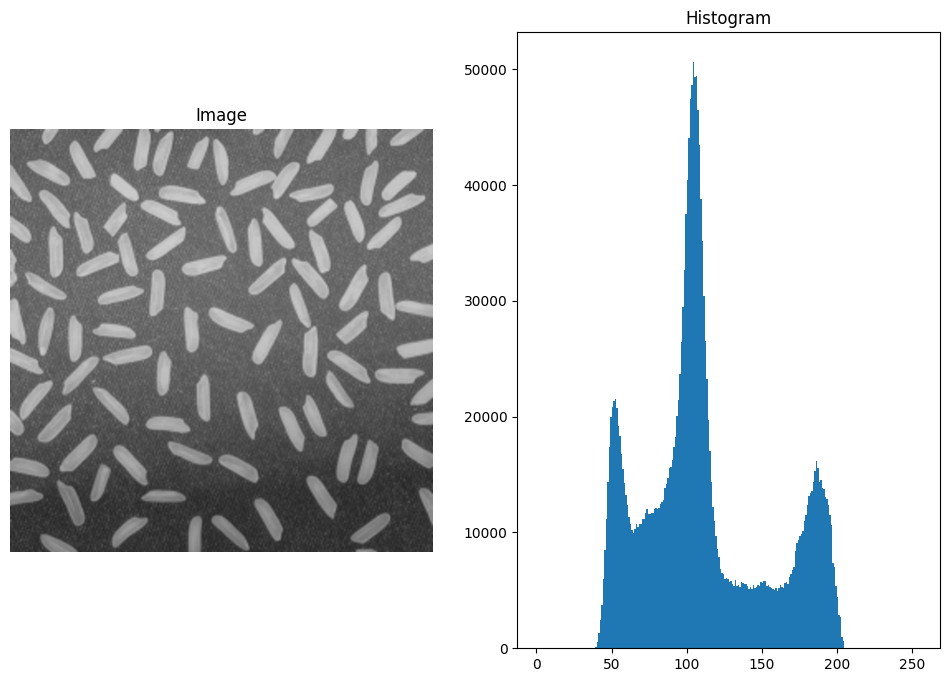

In [188]:
plotImageHist(im_read, hist = True)

9. Understanding the procedure to be carried out, a homomorphic filter is applied to correct the illumination of the original image. To do this, a function is developed that applies the filter to an added image with the following input parameters:
- array_im: Corresponds to the data matrix of the image to which the filter will be applied.
  - type: np.ndarray[]
- gH_value: For gamma High Value.
  - type: float
- gL_value: For gamma Low Value.
  - type: float
- c: For the c constant value of the equation.
  - type: float
- DO: For the DO constant value of the equation.
  - type: float
- validate_axis: A value to validate the dimensions of the input image.
  - type: bool

In [189]:
# Filter homomorphic in frecuency domain
def hmm_filter(img, gH_value: float = 1.5, gL_value: float = 0.5, c: int = 1, DO: int = 30, validate_axis: bool = True):
    # Shape ajust
    im_array = img.copy()
    aux = np.shape(im_array)

    # Dimension validation
    if np.size(im_array) > 2 and validate_axis:
        im_array = im_array[:,:,0]
        aux = np.shape(im_array)

    # Logaritmic transformation
    img_log = np.log1p(im_array)

    # Fast fourier transform
    fft_image = np.fft.fft2(img_log)

    # Create and apply filter
    rows, cols = im_array.shape
    center_row, center_col = int(rows/2), int(cols/2)
    low_pass = np.zeros((rows, cols))
    for i in range(rows):
        for j in range(cols):
            dist = ((i - center_row)**2 + (j - center_col)**2)**0.5
            low_pass[i, j] = (gH_value - gL_value) * (1 - np.exp(-c*(dist**2 / DO**2))) + gL_value
    # Apply filter to img
    result_filter = fft_image * low_pass

    # Inverse fourier transform
    ifft_image = np.fft.ifft2(result_filter)

    # Exponential calculate
    img_exp = np.expm1(np.real(ifft_image))

    # output img normalization
    img_final = (img_exp - np.min(img_exp)) / (np.max(img_exp) - np.min(img_exp)) * 255
    img_final = np.uint8(img_final)

    return img_final

10. Now, the ilumination from original img is corrected, and show his result and histogram.

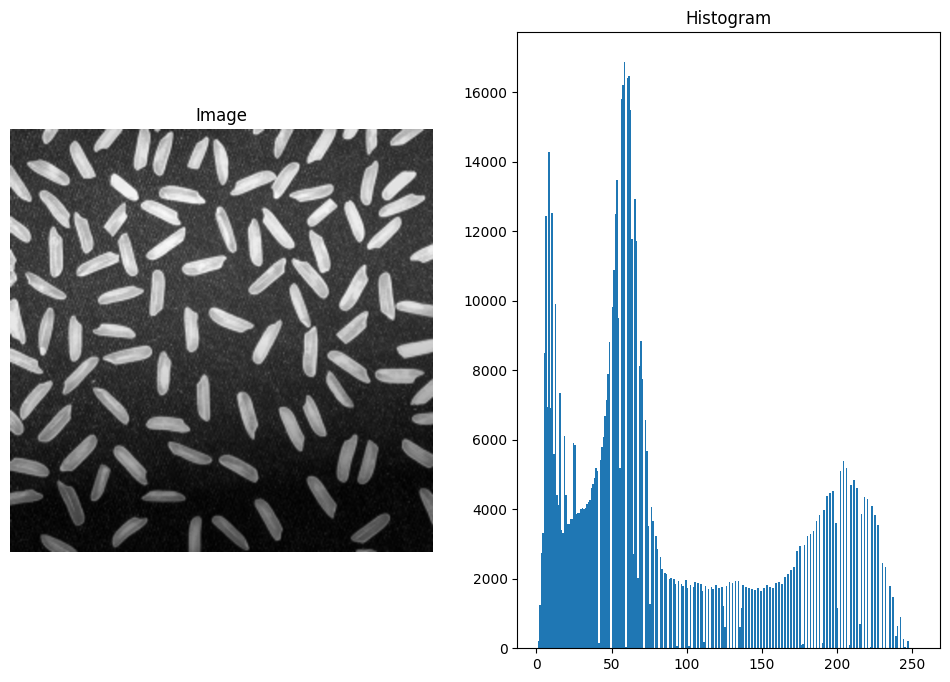

In [190]:
img_preProccess = hmm_filter(array_im, 2, 0.06, 1, 30)
plotImageHist(img_preProccess)

11. Now it is necessary to perform the binarization process of the corrected image. For this, we create a function called "Binarizer" that binarizes an input image at a specific threshold. The input parameters are:
- img: Corresponds to the data matrix of the image to which the filter will be applied.
  - type: np.ndarray[]
- threshold: Corresponds to the binarization threshold value.
  - type: float

In [191]:
# Function for Binarize image, in specific threshold
def Bin_function(img, threshold: int = 128):
    # Uint changer
    img = np.uint8(img)
    aux = np.shape(img)
    # Dimensions validation
    if np.size(aux) > 2:
        img = img[:,:,0]
        aux = np.shape(img)
    # Output matrix
    ImgBin = np.zeros(aux)
    # Cicle for binarization
    for x in range(aux[0]):
        for y in range(aux[1]):
            if img[x][y] >= threshold:
                ImgBin[x][y] = 255
            else:
                ImgBin[x][y] = 0
    # Final retun
    return ImgBin

12. The threshold value is **85**, this was selected by histogram observation and i show this response.

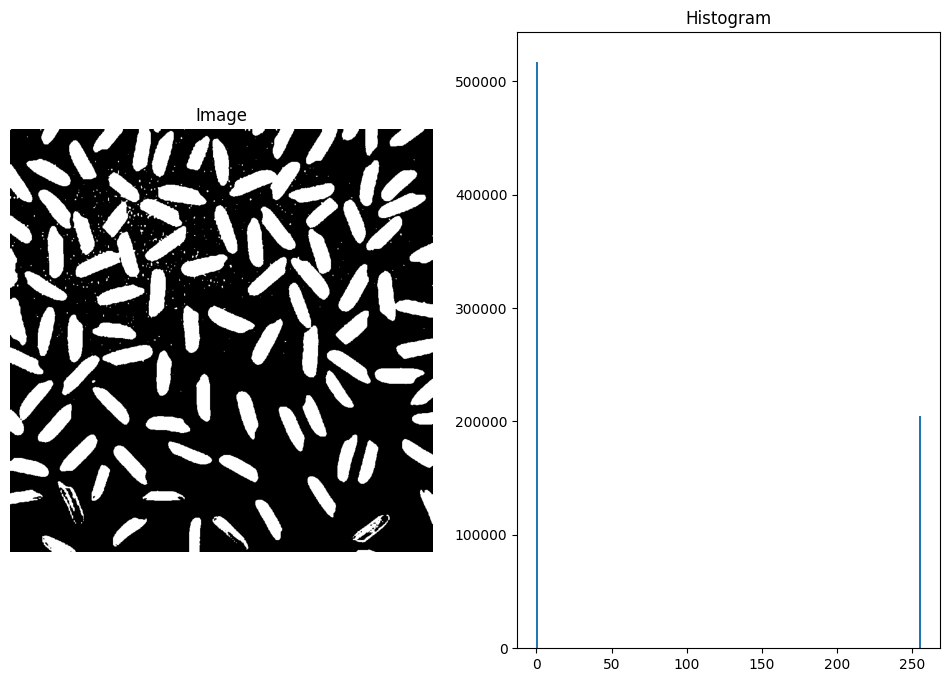

In [192]:
binarized_img = Bin_function(img_preProccess, 85)
plotImageHist(binarized_img)

13. In this case, we can still observe some noise similar to "salt" noise in the image, so it was necessary to develop a function to apply a low-pass filter of nxn dimensions, where n is a positive value. We developed the function that creates a kernel for a spatial filter.
The input parameters of the filter are:
- size_m: Corresponds to the value n, or the size of the filter matrix.
  - type: int
- type_k: A validation value. 0 if you want to create a matrix for an nxn mean filter, 1 to create an nxn Gaussian matrix for a spatial filter.
  - type: int
- sigma: Corresponds to the constant sigma value, in case you want to create a Gaussian filter with a specific sigma value.
  - type: float

In [193]:
def kernel_lowPassFilter(size_m: int = 3, type_k: int = 0, sigma: float = 1.0):
    # check value of size
    if size_m <= 0 or size_m == 1:
        # Default value of size kernel
        size_m = 3
    elif size_m%2 == 0:
        # new size of kernel
        size_m += 1
    
    # mean filter type kernel
    if type_k == 0:
        # Create matrix
        kernel_out = np.ones((size_m, size_m))/size_m**2
    
    # Gaussian Filter Spatial kernel
    elif type_k == 1:
        # Make de gaussian matrix
        kernel_out = np.zeros((size_m, size_m))
        # Calculate de center of matrixx
        center = size_m // 2
        # loops for gaussian calculate
        for i in range(size_m):
            for j in range(size_m):
                x = i - center
                y = j - center
                kernel_out[i, j] = (1 / (2 * np.pi * sigma ** 2)) * np.exp(-(x ** 2 + y ** 2) / (2 * sigma ** 2))
        # Normalize the matrix so that the sum of all elements is 1
        kernel_out /= np.sum(kernel_out)
    # SOutput
    return kernel_out

14. When applying the type of spatial filters, it is necessary to apply some padding method. For this, I created a function that creates padding, following the types of padding discussed in the reference book:
- Zero padding.
- Reflect padding.
- Mirror padding.

In [194]:
# Function for ajust padding from original img
def paddingImg(img, type_p: int = 0, size_p: int = 1):
    # If zero padding 
    if type_p == 0:
        new_img = np.pad(
            img,
            pad_width = size_p,
            mode='constant', 
            constant_values=0
        )
    # For the reflect pading
    elif type_p == 1:
        new_img = np.pad(
            img,
            pad_width = size_p,
            mode='reflect'
        )
    # Mirror
    elif type_p == 2:
        new_img = np.pad(
            img,
            pad_width = size_p,
            mode='edge'
        )
    return new_img

15. To apply the filter to an image, a convolutional function is created. This function performs the convolutional calculation procedure between the filter kernel and an image to be processed. The input parameters are:
- img: Corresponds to the image for convolutional calculation.
  - type: np.ndarray[]
- kernel: Corresponds to the kernel matrix that will be calculated along with the image.
  - type: np.ndarray[]

In [195]:
def applyConvolutional(img, kernel, padd_img = 1):
    # Make copy of original img
    copy_img = img.copy()
    dim_img = copy_img.shape
    # Dimensions of matrix
    dim_m = kernel.shape

    # Validation of val_ separation of pixels
    val_ = int((dim_m[0]-1)/2)

    # Output matrix and padding processing
    copy_img = paddingImg(copy_img, padd_img, val_)
    img_r = np.zeros(dim_img)

    # loops for convolutionaal calculate
    for row_o in range(dim_img[0]):
        for col_o in range(dim_img[1]):
            # Variable sum of convoluttional
            suma_ = 0.0
            for fila_m in range(dim_m[0]):
                for col_m in range(dim_m[1]):
                    # Sum process
                    suma_ += copy_img[row_o+fila_m, col_o+col_m] * kernel[fila_m, col_m]
            img_r[row_o, col_o] = int(suma_)
    return img_r

16. Apply the salt filter to remove the noise from the binarized image. By performing this process, we obtain a sufficiently clean image for processing.

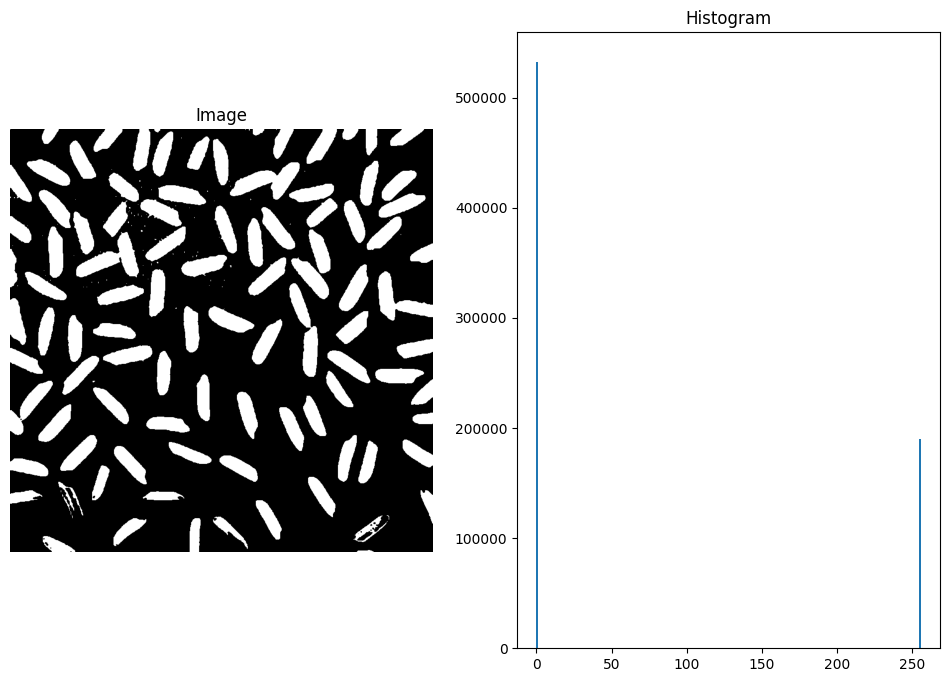

In [196]:
# Kernel for low pass and salt eliminate
low_kernel = kernel_lowPassFilter(3, 0)
# Apply convolutional filter
img_filtered = applyConvolutional(binarized_img, low_kernel)
# New binarize filter for new values
img_filtered = Bin_function(img_filtered, 180)
plotImageHist(img_filtered)

17. After removing the noise and identifying the values corresponding to the possible rice grains, I apply the 8-adjacency pixel relationship method to identify the grouped pixels in each section that could correspond to a rice grain. First, the function rel_adjacency is created, which from the specific coordinates validates whether the pixel being evaluated corresponds to a neighbor or not. The input parameters are:

- mat: Corresponds to the image matrix
  - type: np.ndarray[]
- x, y: Correspond to the coordinates of the position being evaluated.
  - type: float
- label: The ID of the current neighbors being evaluated.
  - type: int
- visited: Corresponds to a boolean matrix that evaluates the relationship between the neighbors.
  - type: np.ndarray[]

In [197]:
# Functions for relacionship between pixels
def rel_adjacency(mat, x, y, label, visited):
    # Stack for storing the pixels to be checked
    stack = [(x, y)]
    directions = [(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]
    
    while stack:
        cx, cy = stack.pop()
        if visited[cx, cy]:
            continue
        # Mark the current pixel as visited and part of the current component
        visited[cx, cy] = True
        mat[cx, cy] = label
        
        # Check all 8 possible directions
        for dx, dy in directions:
            nx, ny = cx + dx, cy + dy
            if 0 <= nx < mat.shape[0] and 0 <= ny < mat.shape[1]:
                if mat[nx, ny] == 1 and not visited[nx, ny]:
                    stack.append((nx, ny))

18. Alongside the functionality of the previous function, create a function that recursively traverses the image data matrix to specifically label them. The label_components function recursively goes through each coordinate labeling the pixels related with the rel_adjacency function.
- mat: Corresponds to the image matrix
  - type: np.ndarray[]

In [198]:
def label_components(mat):
    rows, cols = mat.shape
    # Start labeling from 2, assuming 0 and 1 are already used in the matrix
    label = 102 # In this case we take another number for problems of selecting
    visited = np.zeros_like(mat, dtype=bool)
    
    for i in range(rows):
        for j in range(cols):
            if mat[i, j] == 1 and not visited[i, j]:
                # Start a new component
                rel_adjacency(mat, i, j, label, visited)
                label += 1

    return mat

19. By applying these two functions, I obtain the results of the identified matrix created below.

In [199]:
# The dimensions of the original matrix are determined.
dim_img = img_filtered.shape
# The data of each pixel are normalized to have values between 0 and 1.
normalized_img = img_filtered/255.
# The complete matrix is obtained by classifying each object.
labeled_matrix = label_components(normalized_img)

20. Following this, it is determined which of the identified grains of rice are located at the edges of the image by going through the first row and first column, as well as the last row and last column.

In [200]:
# Obtain lists of edge values.
rows, cols = labeled_matrix.shape

# Obtain a list with each of the rows of the edges.
id_firstRow = [(0, j) for j in range(cols)]
id_firstCol = [(i, 0) for i in range(rows)]

# Indices of the last row and last column.
id_lastRow = [(rows-1, j) for j in range(cols)]
id_lastCol = [(i, cols-1) for i in range(rows)]

# A complete list of the external indices is obtained.
id_firstRow.extend(id_firstCol)
id_firstRow.extend(id_lastRow)
id_firstRow.extend(id_lastCol)

21. If an object exists related to the previously listed positions, it is removed from the image points matrix.

In [201]:
# loop for external indices
for value in id_firstRow:
    # It is checked if any object exists on the edges and it is removed.
    if labeled_matrix[value] >= 0:
        labeled_matrix = np.where(labeled_matrix == labeled_matrix[value], 0, labeled_matrix)

22. In the final image, different objects that could be a grain of rice are obtained. To differentiate them, we consider a minimum pixel area to verify that it is not noise present in the image.

In [202]:
# Function to obtain values different from 0
def obtain_vals(array_, value_s):
    # Returns the number of values related to an ID (per pixel))
    return np.count_nonzero(array_ == value_s)

# List of rice 
rice_list = []
# List of all rice points
rice_mat_list = []
# Final value matrix img
matrix_final = labeled_matrix.copy()

# Loop for check all objects in identify matrix
for val in range(1, int(labeled_matrix.max()) + 1):
    # non-zero values from max matrix
    cant_obj = obtain_vals(labeled_matrix, val)
    if cant_obj != 0:
        # Value of validation for real rice, nothing of noise
        if cant_obj <= 500:
            # add object
            matrix_final = np.where(matrix_final == val, 0, matrix_final)
        # add all rice grain
        else:
            rice_list.append(cant_obj)
            rice_mat_list.append(np.where(matrix_final == val, matrix_final, 0))
# Final matrix return
matrix_final = Bin_function(matrix_final, 1)

23. The final result of the number of grains of rice, the mean number of pixels, and the standard deviation is presented as follows.

In [203]:
# Library for print response
import json
# Values matrix
matrix_values = np.array(rice_list)
# Dict of all data request
response = {
    "Total Number of Grains of Rice (Count)": matrix_values.shape[0],
    "Mean Size of Grains of Rice (pixels)": round(matrix_values.mean(), 2),
    "Standard Deviation of Grain Size (+/-)": round(matrix_values.std(), 2),
    "Largest Grain of Rice (px)": matrix_values.max(),
    "Smallest Grain of Rice (px)": matrix_values.min()
}
# Final response
response

{'Total Number of Grains of Rice (Count)': 68,
 'Mean Size of Grains of Rice (pixels)': 2207.38,
 'Standard Deviation of Grain Size (+/-)': 666.11,
 'Largest Grain of Rice (px)': 4772,
 'Smallest Grain of Rice (px)': 561}

24. The number of pixels in each of the identified grains of rice is presented below.

In [204]:
cant_riceGrain = dict()
for i, val in enumerate(rice_list):
    cant_riceGrain[f"Rice Grain number {i+1}"] = val
cant_riceGrain

{'Rice Grain number 1': 2242,
 'Rice Grain number 2': 1628,
 'Rice Grain number 3': 2087,
 'Rice Grain number 4': 2140,
 'Rice Grain number 5': 2384,
 'Rice Grain number 6': 2157,
 'Rice Grain number 7': 4772,
 'Rice Grain number 8': 2102,
 'Rice Grain number 9': 1841,
 'Rice Grain number 10': 2116,
 'Rice Grain number 11': 2610,
 'Rice Grain number 12': 2312,
 'Rice Grain number 13': 2341,
 'Rice Grain number 14': 1727,
 'Rice Grain number 15': 2394,
 'Rice Grain number 16': 2111,
 'Rice Grain number 17': 1834,
 'Rice Grain number 18': 2294,
 'Rice Grain number 19': 2523,
 'Rice Grain number 20': 2103,
 'Rice Grain number 21': 2136,
 'Rice Grain number 22': 2351,
 'Rice Grain number 23': 2527,
 'Rice Grain number 24': 2371,
 'Rice Grain number 25': 2275,
 'Rice Grain number 26': 4755,
 'Rice Grain number 27': 2517,
 'Rice Grain number 28': 2480,
 'Rice Grain number 29': 2718,
 'Rice Grain number 30': 2712,
 'Rice Grain number 31': 2459,
 'Rice Grain number 32': 2111,
 'Rice Grain numb

25. Finally, the final processing and comparison of the rice images in each of the processes carried out are visualized. For this, a function is created that displays multiple images at the same time.

In [205]:
# Function for plot many images
def plotImages(img: list, cant_imgs: int = 2, list_title: list = ["original", "comparacion"]) -> None:
    val_im = 0
    cant_rows = cant_imgs//2
    if cant_rows == 0:
        cant_rows = 1
    fig, ax_s = plt.subplots(nrows = cant_rows, ncols = 2, figsize = (16, 12))
    if cant_rows == 1:
        for i in range(cant_imgs):
            ax_s[i].imshow(np.uint8(img[i]), cmap='gray', vmin=0, vmax=255)
            ax_s[i].set_title(list_title[i])
            ax_s[i].axis('off')
    else:
        for i in range(cant_rows):
            for j in range(2):
                ax_s[i][j].imshow(np.uint8(img[val_im]), cmap='gray', vmin=0, vmax=255)
                ax_s[i][j].set_title(list_title[val_im])
                ax_s[i][j].axis('off')
                val_im+=1
    return None

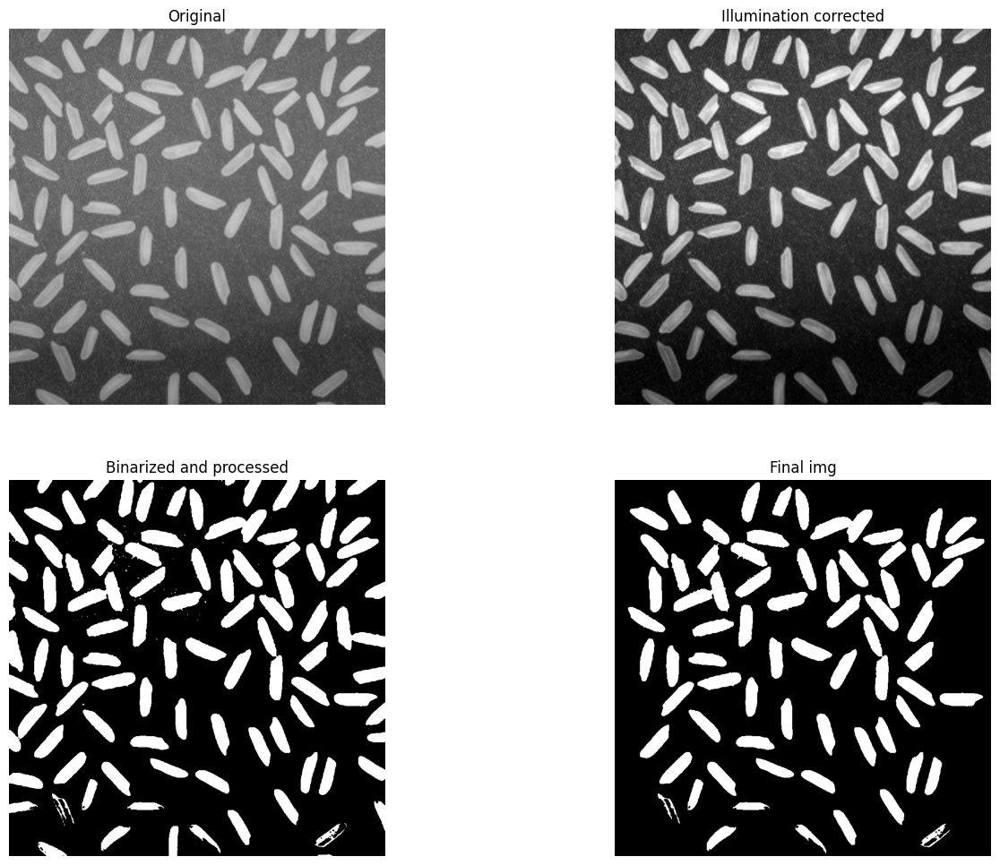

In [206]:
# Final validation
mat_test = Bin_function(labeled_matrix, 1)
plotImages(
    [im_read, img_preProccess, img_filtered, matrix_final],
    4,
    ["Original", "Illumination corrected", "Binarized and processed", "Final img"]
)

#### **Second Point**:
Make a routine that implements an NxN (N must be an odd number) spatial convolution mask. You must discuss possible solutions for padding the borders and implement one of them. Evaluate the implemented routine on the lena.tif image, for the following cases: a. Low-Pass Filter, b. Laplacian filter (adding the original image to the result), c. Sobel filter (pass the two masks and return the image of the gradient magnitude). Show the obtained images and analyze them.

1. First, we load the image as a data matrix using the functions developed earlier. Additionally, we visualize the image for validation.

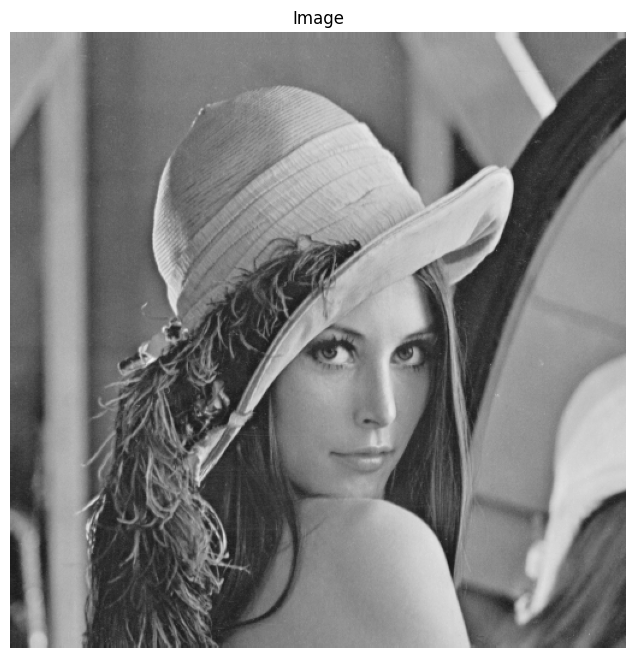

In [207]:
# Develop of first point in homework
name_img = "lena"

# Get img_read an array
im_read, array_im = get_img(path_img = imagenes_[name_img])
plotImageHist(im_read, hist = False)

2. Following the steps outlined in the list, the functions that allow me to apply the low-pass, Laplacian, and Sobel filters to the "Lena" image are developed. The low-pass filter was developed for an application in the first point, with the name `kernel_lowPassFilter`, where the equations from the reference book are used to implement a possible mean filter or, alternatively, a Gaussian filter that meets the conditions of the low-pass filters. The explanation of this function is detailed in section 1.13. (As well as a function developed to apply convolution to the filters `applyConvolutional` in section 1.15).

3. The function that creates the kernel for applying the Laplace spatial filter is then also developed. For this, the function `laplace_filter` is created, and the filter possibilities are followed according to the equations presented in the reference book. The input parameters of the function are:
- `type_filter`: Corresponds to the type of Laplace filter to be applied. In the case of the reference book, 3 options are presented:
    1. Type 0: Corresponds to the matrix type from the reference book:
        ```python
        [[0, -1, 0],
         [-1, 4, -1],
         [0, -1, 0]]
        ```
    2. Type 1: Corresponds to the matrix type from the reference book:
        ```python
        [[-1, -1, -1],
         [-1, 8, -1],
         [-1, -1, -1]]
        ```
    3. Type 3: Creates a Laplacian-type matrix for nxn values.
  - `type`: int
- `sigma`: Corresponds to the sigma value in the Laplacian equation.
  - `type`: float
- `dim`: Is the desired dimension size for the type 3 kernel.
  - `type`: int


In [208]:
# Laplace filter
def laplace_filter(type_filter: int = 0, sigma: float = 1.0, dim: int = 3):
    # Kernel for 1 type value
    if type_filter == 0:
        mask_ = np.array([[0, -1, 0],
                          [-1, 4, -1],
                          [0, -1, 0]])
    # Kernel for 2 type value
    elif type_filter == 1:
        mask_ = np.array([[-1, -1, -1],
                          [-1, 8, -1],
                          [-1, -1, -1]])
    # Kernel for 3 type value
    else:
        size = 6 * sigma
        x = np.linspace(-size, size, dim)
        y = np.linspace(-size, size, dim)
        x, y = np.meshgrid(x, y)
        # calculate kernel
        norm = (x**2 + y**2) / (2.0 * sigma**2)
        mask_ = (-1 / (np.pi * sigma**4)) * (1 - norm) * np.exp(-norm)
    # Return mask for laplacian filter
    return mask_

3. The function that creates the kernel for applying the sobel spatial filter is then also developed. For this, the function `sobel_classic` is created, and the filter possibilities are followed according to the equations presented in the reference book. The input parameters of the function are:
- `img`: It corresponds to the image to which the filter will be applied. For this, the matrices corresponding to the filter kernel are created such that:
    ```python
    [[1, 0, -1],
     [2, 0, -2],
     [1, 0, -1]]
    ```
    ```python
    [[1,   2,  1],
     [0,   0,  0],
     [-1, -2, -1]]
    ```
  - `type`: np.ndarray[]

In [209]:
def sobel_classic(img):
    # Get dimensions from matrix img
    dim_i = img.shape
    img_r = np.zeros(dim_i)

    # filter matrix
    Gx = np.array([[1.0, 0.0, -1.0], [2.0, 0.0, -2.0], [1.0, 0.0, -1.0]])
    Gy = np.array([[1.0, 2.0, 1.0], [0.0, 0.0, 0.0], [-1.0, -2.0, -1.0]])

    # loop for coordenates of img matrix
    for row_o in range(1, dim_i[0] - 2):
        for col_o in range(1, dim_i[1] - 2):
            gx = np.sum(np.multiply(Gx, img[row_o:row_o + 3, col_o:col_o + 3]))  # x direction
            gy = np.sum(np.multiply(Gy, img[row_o:row_o + 3, col_o:col_o + 3]))  # y direction
            img_r[row_o + 1, col_o + 1] = np.sqrt(gx ** 2 + gy ** 2)  # calculate the "hypotenuse"
        
    return img_r

4. Aplico los filtros creados a las imagenes, usando diferentes paddings para entender que cambia de acuerdo en la salida de estas. PRIMERO SE APLICA EL PADDING DE ZEROS.

In [210]:
# First, the mean filter, using a 5x5 filter.  
mean_filter = kernel_lowPassFilter(5)
img_meanFilter = applyConvolutional(array_im, mean_filter, 0)

# Second, I apply the Laplacian filter of type 1, the second matrix presented in the reference book.  
kernel = laplace_filter(1)
img_laplace = applyConvolutional(array_im, kernel, 0)
#It is necessary to normalize the output to better visualize the filter's response.  
#img_laplace = 255*(img_laplace - np.min(img_laplace))/(np.max(img_laplace) - np.min(img_laplace))
# sum original img
img_laplace = array_im + img_laplace
#img_laplace = 255*(img_laplace - np.min(img_laplace))/(np.max(img_laplace) - np.min(img_laplace))
img_laplace = np.clip(img_laplace, 0, 255)

# Finally, I apply the Sobel filter to the image.  
# In this filter, a special padding is used, so the image is not affected.
img_sobel = sobel_classic(array_im)

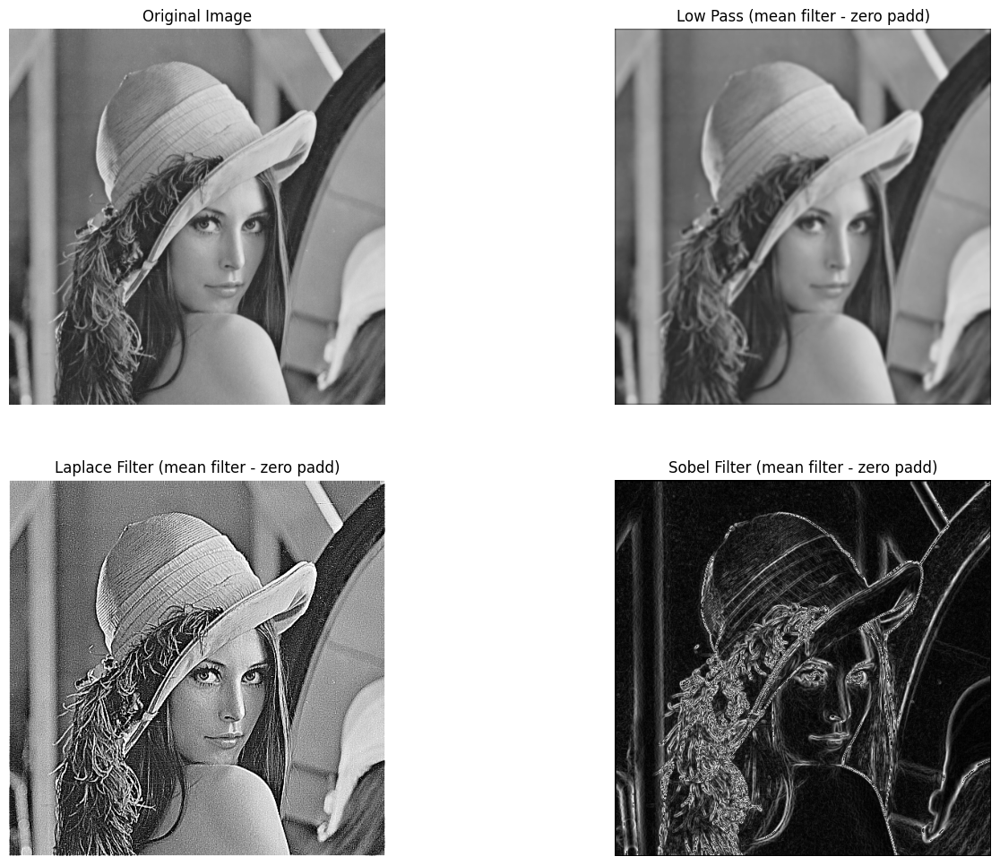

In [211]:
# Visualize the comparison of the obtained images.
plotImages(
    [array_im, img_meanFilter, img_laplace, img_sobel],
    cant_imgs = 4,
    list_title=["Original Image", "Low Pass (mean filter - zero padd)", 
                "Laplace Filter (mean filter - zero padd)", "Sobel Filter (mean filter - zero padd)"]
)

**Analysis:** I observe the response of the created filters on the Lena images, considering the following discussions:
1. We observe that when applying zero padding, we obtain a black border related to the size of the filter matrix used. This is due to the effect produced when applying the filter to the image, losing information in the initial and final rows and columns.
2. The response of the other filters is similar to what was expected.
3. In the case of the Laplace filter, when the image is added to the filter's response, some contours and dark values are intensified.

Now I perform the same procedure with reflective padding.

In [212]:
# First, the mean filter, using a 5x5 filter.  
mean_filter_2 = kernel_lowPassFilter(5)
img_meanFilter_2 = applyConvolutional(array_im, mean_filter_2, 1)

# Second, I apply the Laplacian filter of type 1, the second matrix presented in the reference book.  
kernel_2 = laplace_filter(1)
img_laplace_2 = applyConvolutional(array_im, kernel_2, 1)
#It is necessary to normalize the output to better visualize the filter's response.  
#img_laplace_2 = 255*(img_laplace_2 - np.min(img_laplace_2))/(np.max(img_laplace_2) - np.min(img_laplace_2))
# sum original img
img_laplace_2 = array_im + img_laplace_2
img_laplace_2 = np.clip(img_laplace_2, 0, 255)

# Finally, I apply the Sobel filter to the image.  
# In this filter, a special padding is used, so the image is not affected.
img_sobel_2 = sobel_classic(array_im)

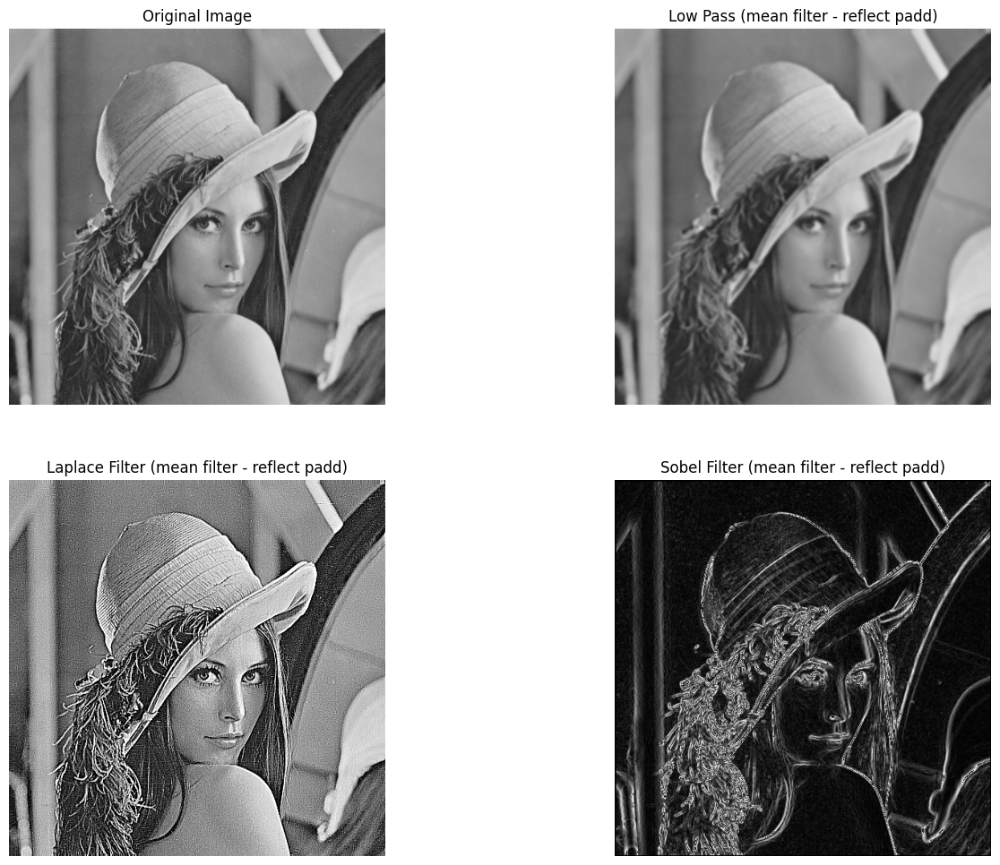

In [213]:
# Visualize the comparison of the obtained images.
plotImages(
    [array_im, img_meanFilter_2, img_laplace_2, img_sobel_2],
    cant_imgs = 4,
    list_title=["Original Image", "Low Pass (mean filter - reflect padd)", 
                "Laplace Filter (mean filter - reflect padd)", "Sobel Filter (mean filter - reflect padd)"]
)

**Analysis:** In this case, we observe that by changing the padding system, the border of the images changes. In this case, we no longer have the black border when using zero padding, but instead, we obtain a cleaner image. According to the literature, the best expected response in most cases is given by mirror padding.

#### **Third Activity**:
Using the image Fig3.46(a).jpg, repeat the procedures presented in Section 3.7 in order to obtain the images shown in figure 3.43 of the textbook (3rd edition). Make the necessary considerations.

1. First, we load the image as a data matrix using the functions developed earlier. Additionally, we visualize the image for validation.

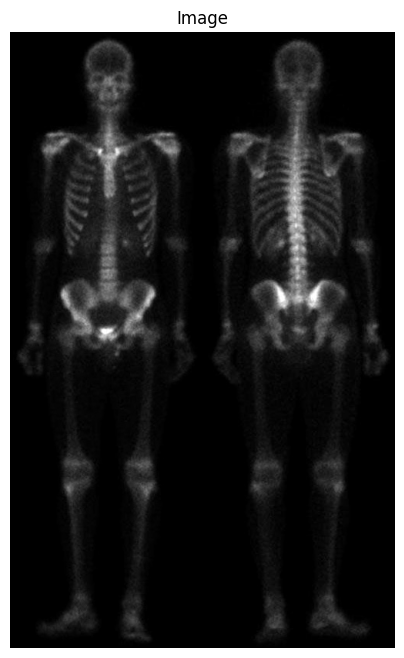

In [214]:
# Develop of first point in homework
name_img = "Fig3"

# Get img_read an array
im_read, array_im = get_img(path_img = imagenes_[name_img])
plotImageHist(im_read, hist = False)

2. Following the steps in the reference book, we use the functions developed in point 2 to apply the `laplace_filter`, sum with the original image, and the response of the `sobel_classic`.

In [215]:
# First, using laplace filter i make the process from referece book
laplace_k = laplace_filter(1)
img_laplace = applyConvolutional(array_im, laplace_k, 1)
# Image normaliced from original img with laplace k
img_laplace2 = 255*(img_laplace - np.min(img_laplace))/(np.max(img_laplace) - np.min(img_laplace))
# Next to make is the shappered of original img and laplace without normalization
img_shappered = array_im + img_laplace
img_shappered = np.clip(img_shappered, 0, 255)
# Finally sobel Gradient
img_r_sobel_classic = sobel_classic(array_im)

3. The result of the application of the filters is shown.

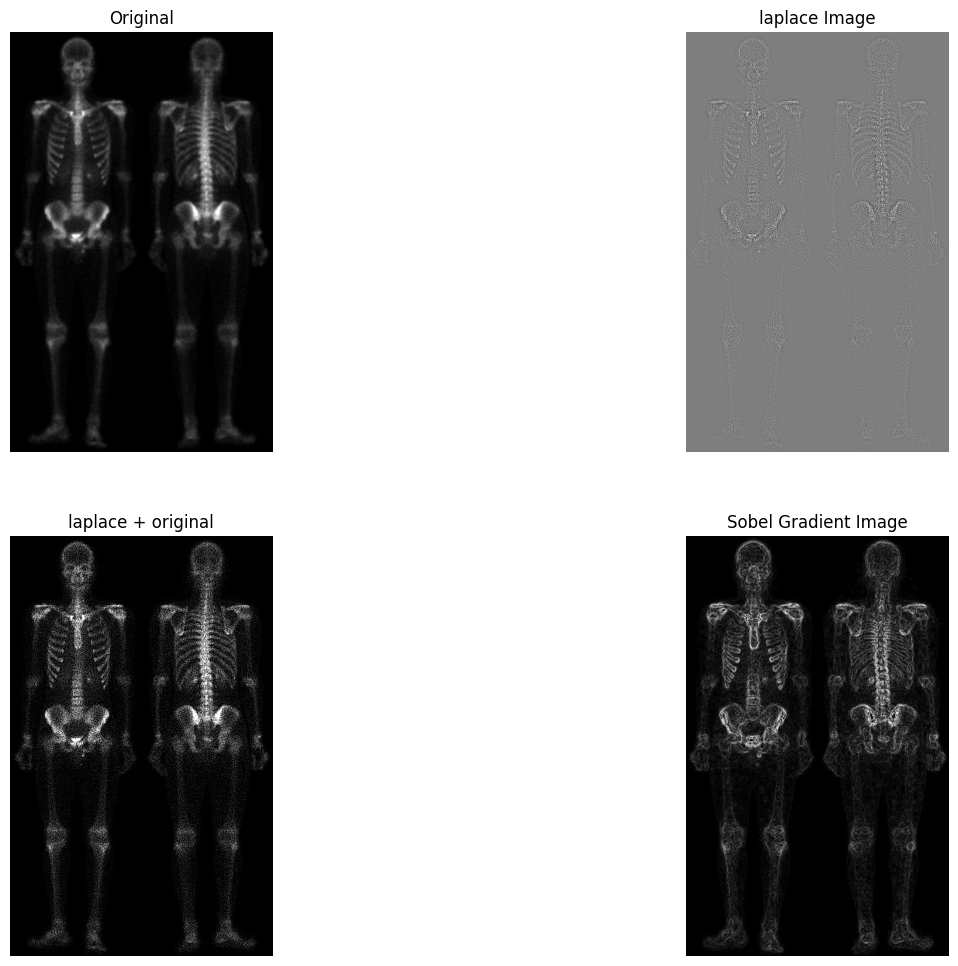

In [216]:
plotImages(
    [array_im, img_laplace2, img_shappered, img_r_sobel_classic],
    cant_imgs = 4,
    list_title=[
        "Original", "laplace Image", "laplace + original", "Sobel Gradient Image"])

4. Following the procedure guided in the reference book, we apply a 5x5 low-pass filter to the Sobel Gradient image, in this case using reflective padding to avoid loss of information, using the `kernel_lowPassFilter` function developed in point 2.

In [217]:
# Low pass filter for sobel gradient image
kernel_lowPassFilter_5x5 = kernel_lowPassFilter(5, 0, 1)
img_sobel_Low = applyConvolutional(img_r_sobel_classic, kernel_lowPassFilter_5x5)

5. Now, the multiplication is performed between the matrices obtained from _"laplace + original"_ and the one obtained in the previous process _img_sobel_Low_.

In [218]:
# Product
product_img = img_shappered*img_sobel_Low
# Normalization
product_img = product_img / np.max(product_img) * 255

6. Now we sum the original image and the one obtained in the previous process.

In [219]:
sum_image = array_im + product_img
sum_image = np.clip(sum_image, 0, 255)

7. Finally, we apply the power law transformation to the image obtained in the previous process. According to the reference text, the result is not exactly the same as the image in the book. Therefore, after many tests, it is established that for the transformation, a Gamma value of 0.6 and C = 11 are used. This generates an image identical to the desired one.

In [220]:
# powerlaw transformation
gamma = 0.6  
c = 11
img_transformed = c * (sum_image ** gamma)
img_transformed = np.clip(img_transformed, 0, 255)

8. We show the obtained result.

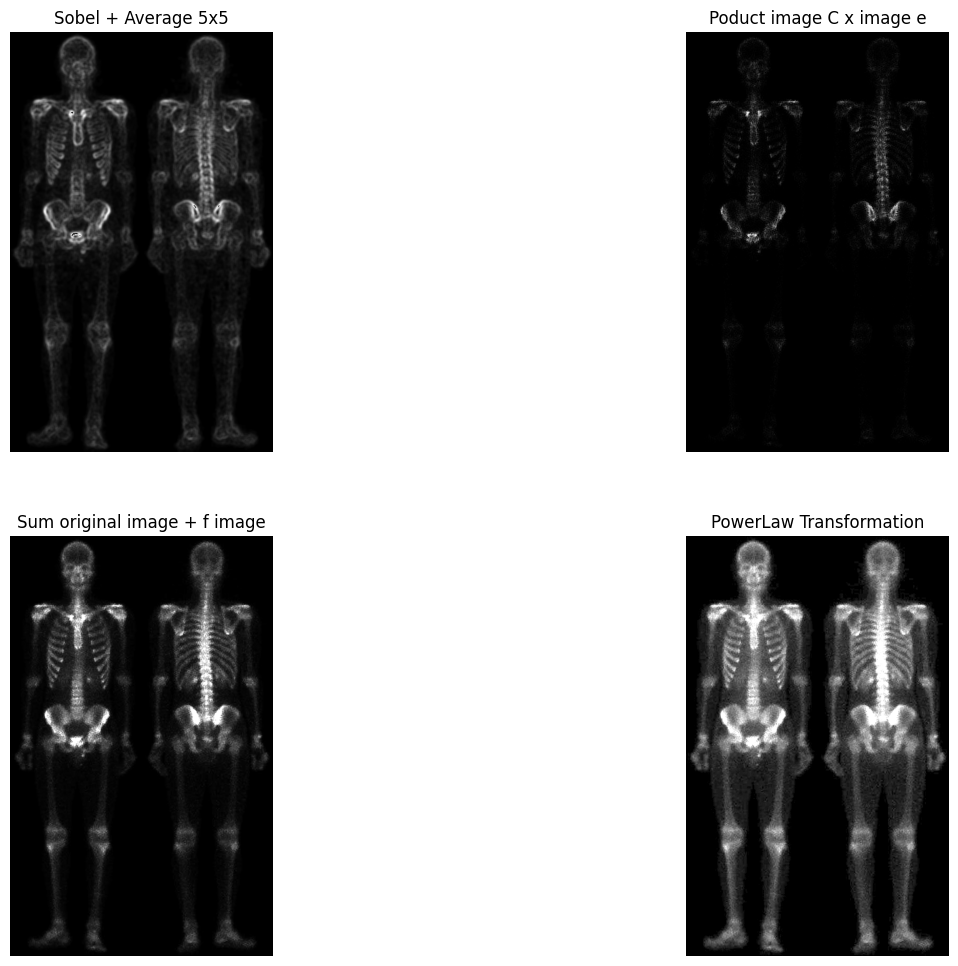

In [221]:
plotImages(
    [img_sobel_Low, product_img, sum_image, img_transformed],
    cant_imgs = 4,
    list_title=[
        "Sobel + Average 5x5", "Poduct image C x image e", "Sum original image + f image", "PowerLaw Transformation"])

**Analysis:** Following the procedure described in this point, the obtained result is very similar to that presented in image 3.43, section 3.7. In this case, some changes were made to the final image to obtain a result very similar to the expected one.

#### **Fourth activity**:
Prepare the image fig4.19(a).jpg to be applied to an OCR. Note that pixels of the same character must be 8-connected. Show the result. Then, detect the edge of the letters in the treated image and show the result obtained.

1. First, we load the image as a data matrix using the functions developed earlier. Additionally, we visualize the image for validation.

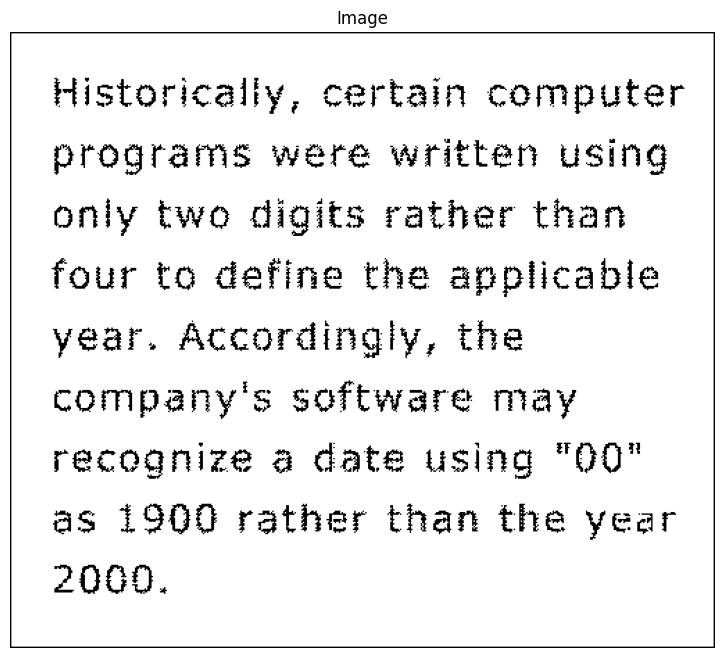

In [222]:
# Develop of first point in homework
name_img = "Fig4"

# Get img_read an array
im_read, array_im = get_img(path_img = imagenes_[name_img])
plotImageHist(im_read, hist = False)

3. For this case, filtering tools in the frequency domain are used, as seen in image 4.49 of the reference book. To achieve this, a function corresponding to the Gaussian filter in frequency is developed with a default cutoff frequency (DO) of 80. This helps to correct the edges of the original image so that the letters can be better detected. This function is called "gaussian_filter_frequency," where the input parameters are:
- `img`: It corresponds to the image to which the filter will be applied. 
  - `type`: np.ndarray[]
- `DO`: It is the initial distance value for the Gaussian filter.
  - `type`: int

In [223]:
# Function for gaussian filter
def gaussian_filter_frecuency(img_, DO = 80):
    # Get dimensions of img 
    P, C = img_.shape
    # Get u and v
    u, v = np.meshgrid(np.arange(-C//2, C//2), np.arange(-P//2, P//2))
    
    # Calculate D
    D = np.sqrt(u**2 + v**2)

    # Calculate H
    H = np.exp(-(D**2) / (2 * (DO**2)))

    return H

4. The filter is applied to the image, and the result is observed.

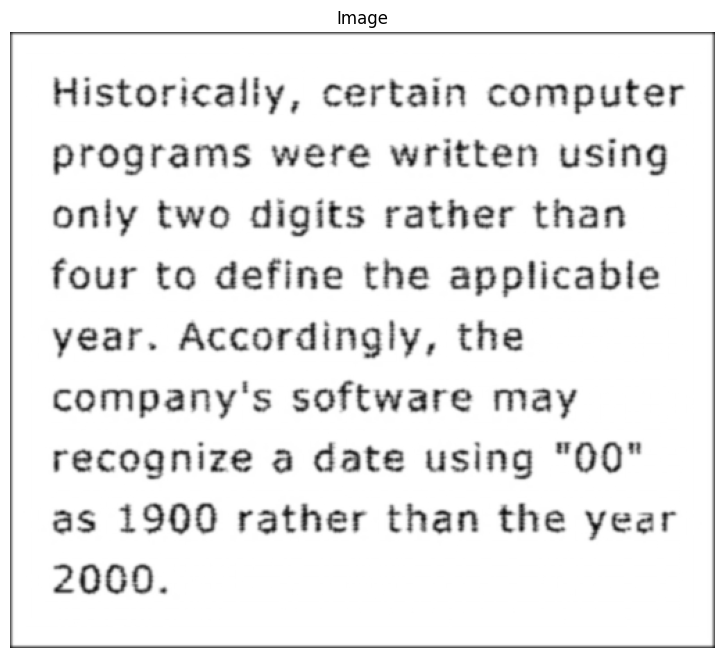

In [224]:
# Calculate fft of array img
F_img = np.fft.fft2(array_im)

# Get value of H
H_from_img = gaussian_filter_frecuency(array_im)

# Multiply values
image_filter = np.real(
    np.fft.ifft2(F_img * np.fft.fftshift(H_from_img))
)
plotImageHist(image_filter, hist = False)

5. The same procedure is carried out for the application of the not cuadratic Sobel function, creating a function `non_cuadratic_sobel`, with the input parameters:
- `img`: It corresponds to the image to which the filter will be applied. 
  - `type`: np.ndarray[]

In [225]:
def non_cuadratic_sobel(img_):
    # X and y kernels
    kS_x = np.array([[-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]])
    kS_y = np.array([[-1, -2, -1],
                     [0, 0, 0],
                     [1, 2, 1]])
    # obtain axis
    axis_x = applyConvolutional(img_, kS_x)
    axis_y = applyConvolutional(img_, kS_y)
    # Final calcule
    axis = np.sqrt(axis_x**2 + axis_y**2)
    axis_norma = (axis - np.min(axis)) / (np.max(axis) - np.min(axis)) * 255

    return axis_norma

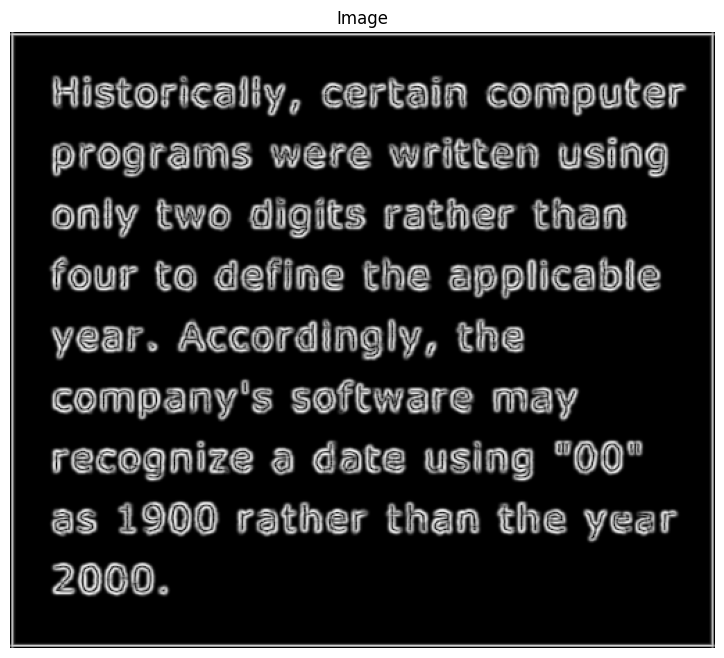

In [226]:
final_img = non_cuadratic_sobel(image_filter)
plotImageHist(final_img, hist = False)

#### **fifth Activity**:
For images mar-il.gif and image.png, make a lighting correction using the homomorphic filter. Do the same with the LogAbout method (from the attached paper) and compare the results. Show the histograms of images before and after procedures and analyze them.

1. First, to visualize the processing image of this point, it is of type .gif, so the dimensions of this image are (1, xx, xx). Processing must be done to obtain the precise values, and the first row of the image, which corresponds to visible noise, is removed.

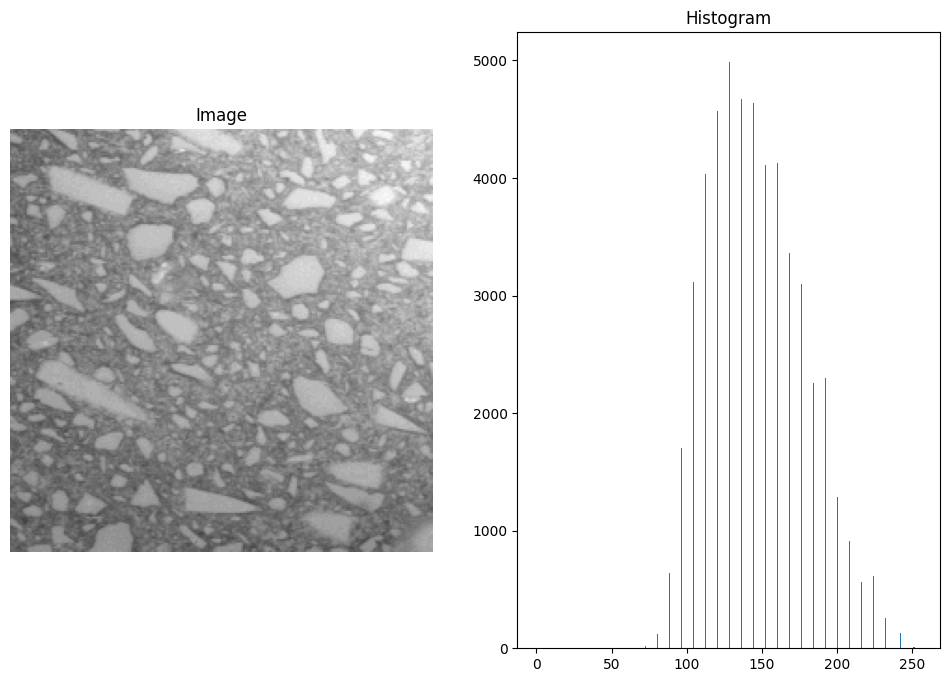

In [227]:
# Image name
name_img = "mar-il"

# Get img_read an array
im_read, array_im = get_img(path_img = imagenes_[name_img])
# Read first canal of image
im_read = im_read[0,]
array_im = array_im[0,]

# and correct dimensions for eliminate de first row
im_read = im_read[1::,]
array_im = array_im[1::,]
plotImageHist(im_read, hist = True)

2. Following this, we use the filter developed in point 1, section 9, where the homomorphic filter is applied in the frequency domain. In this case, with a gamma H = 1.5, gamma L = 0.5, a value of c = 1, and a value of D0 = 80 (recommended for this type of filter). The result is then visualized with his histogram.

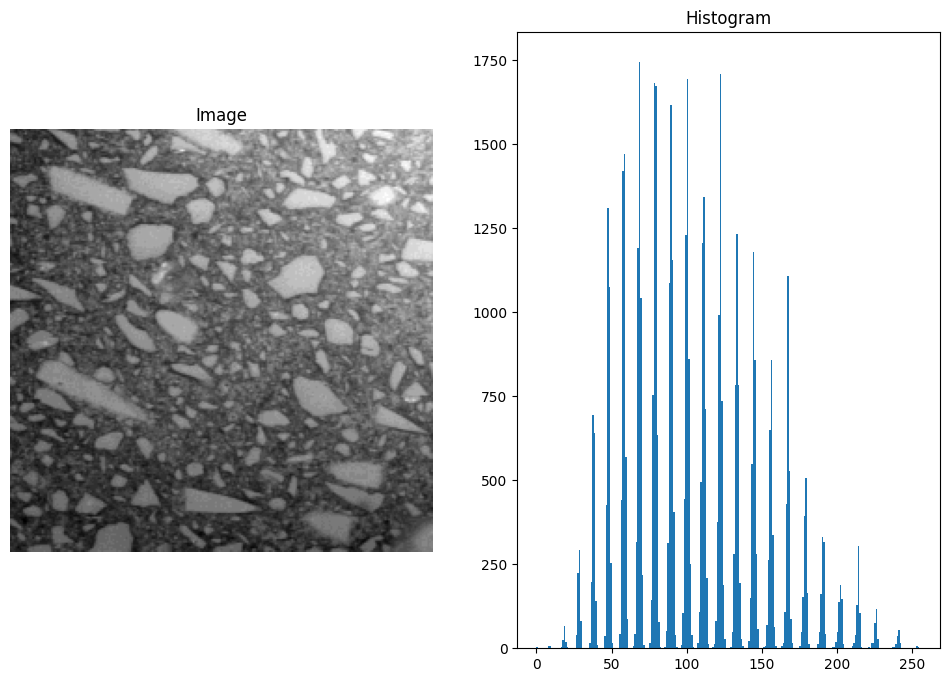

In [228]:
img_filtered = hmm_filter(array_im, 1.2, 0.8, 1, 80, validate_axis = False)
plotImageHist(img_filtered, hist = True)

3. For the next step, the `logAbout` function is implemented, extracted exactly from the paper following the presented instructions. This function has the following input parameters:
- `img`: It corresponds to the image to which the filter will be applied. 
  - `type`: np.ndarray[]
- `c`: It corresponds to the value of the constant used in the calculation.
  - `type`: float

In [229]:
# logAbout method
def logAbout_fromPaper(img, c = 1):
    if len(img.shape) > 2:
        # delete channel if necessary
        img = img[:,:,0]
    # First, we create the high-pass filter.  
    kernel_logAbout = np.array([[-1, -1, -1],
                                [-1, 9, -1],
                                [-1, -1, -1]])
    # We apply the convolution.  
    img_applyfilter = applyConvolutional(array_im, kernel_logAbout)
    # Correction of the maximum value of the high-pass filter.  
    img_correction = np.clip(img_applyfilter, 0, 255)
    
    # We create the value of c.  
    # We apply the logarithmic calculation.  
    loga = c * np.log(img_correction)
    # We obtain the maximum value of the image.  
    max_val = np.max(1 + loga)
    # Final normalization.
    img_final = np.uint8(loga/max_val * 255)
    
    return img_final

4. Showing the obtained result:

C:\Users\edavi\AppData\Local\Temp\ipykernel_43384\2804123708.py:17: RuntimeWarning: divide by zero encountered in log
  loga = c * np.log(img_correction)
C:\Users\edavi\AppData\Local\Temp\ipykernel_43384\2804123708.py:21: RuntimeWarning: invalid value encountered in cast
  img_final = np.uint8(loga/max_val * 255)


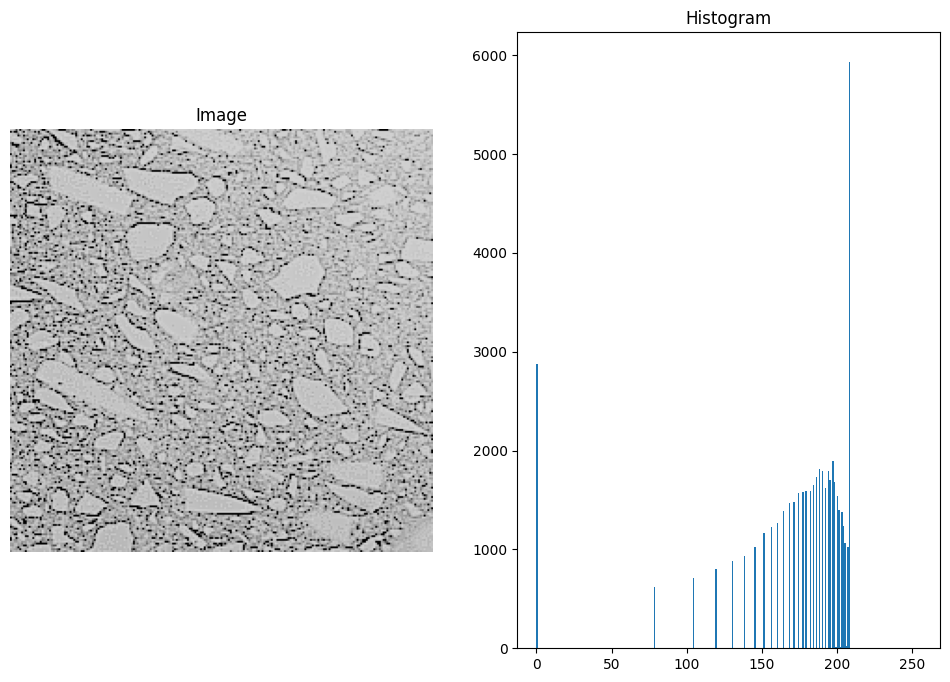

In [230]:
img_final = logAbout_fromPaper(array_im, 0.8)
plotImageHist(img_final, hist = True)

5. Visualizing the result and comparing the original with the homomorphic and the logAbout filter, we can observe that what is sought with these methods in the paper is to highlight the contours of the objects in the test image. In the logAbout function, if we change the value of c to values between 0 and 1, the result is a visibly darker image, and values greater than 1 lighten the image more. It should be understood that the use of this filter is associated with the recognition of faces, features, and more.

C:\Users\edavi\AppData\Local\Temp\ipykernel_43384\2804123708.py:17: RuntimeWarning: divide by zero encountered in log
  loga = c * np.log(img_correction)
C:\Users\edavi\AppData\Local\Temp\ipykernel_43384\2804123708.py:21: RuntimeWarning: invalid value encountered in cast
  img_final = np.uint8(loga/max_val * 255)


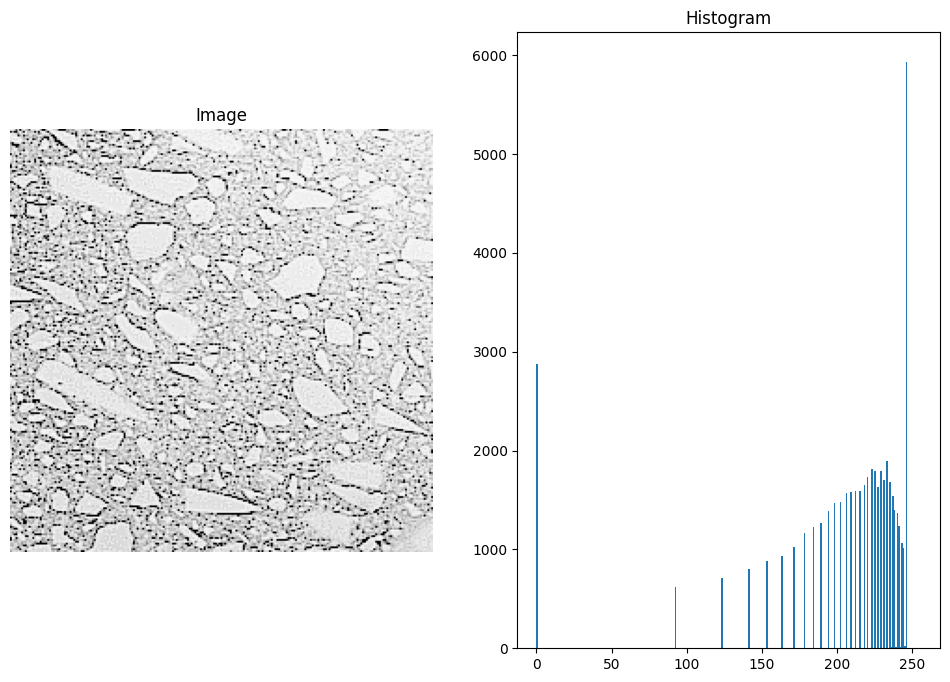

In [231]:
img_final_2 = logAbout_fromPaper(array_im, 5)
plotImageHist(img_final_2, hist = True)

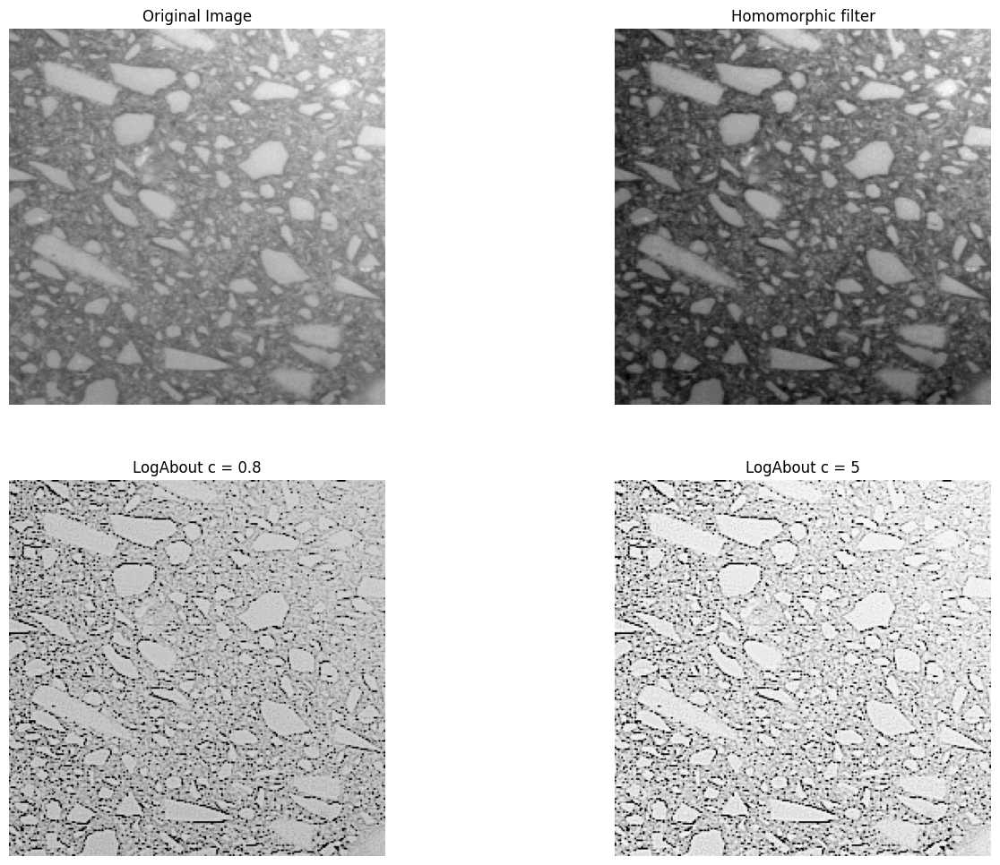

In [232]:
plotImages(
    [array_im, img_filtered, img_final, img_final_2],
    cant_imgs = 4,
    list_title=[
        "Original Image", "Homomorphic filter", "LogAbout c = 0.8", "LogAbout c = 5"])

7. Following this, the procedure is carried out for the second image to observe if the behavior of the filters is similar. First, a function is created to remove the color channel from an image and take only a section that would correspond to its grayscale value. This function, `del_channel`, receives the following input parameters:
- `img`: It corresponds to the image to which the filter will be applied. 
  - `type`: np.ndarray[]

In [233]:
# Function for delete one channel
def del_channel(img):
    if len(img.shape) > 2:
        # Extract 0 channel from img
        img = img[:,:,0]
    return img

8. Also, I realize that the images being used do not have the same height and width, that is, f(M, N) where M ≠ N. Therefore, it is necessary to create a function that resizes an image using the nearest neighbor method. This function is named `resize_nearest_neighbor`, and it receives the following input parameters:
- `image`: It corresponds to the image to which the filter will be applied. 
  - `type`: np.ndarray[]
- `new_height`: It corresponds to the value of the new height of the image.
  - `type`: int
- - `new_width`: It corresponds to the value of the new width of the image.
  - `type`: int

In [234]:
# Resize function
def resize_nearest_neighbor(image, new_height, new_width):
    if len(image.shape) > 2:
        # del extra channel
        image = image[:,:,0]
    # Start of resizing
    orig_height, orig_width = image.shape[:2]
    scale_h = orig_height / new_height
    scale_w = orig_width / new_width

    new_image = np.zeros((new_height, new_width))

    for i in range(new_height):
        for j in range(new_width):
            x = int(i * scale_h)
            y = int(j * scale_w)
            new_image[i, j] = image[x, y]

    return new_image

9. Thus, the new image is loaded, extra channels are removed if necessary, and resizing is done using the smaller value between the height and the width to avoid conflicts.

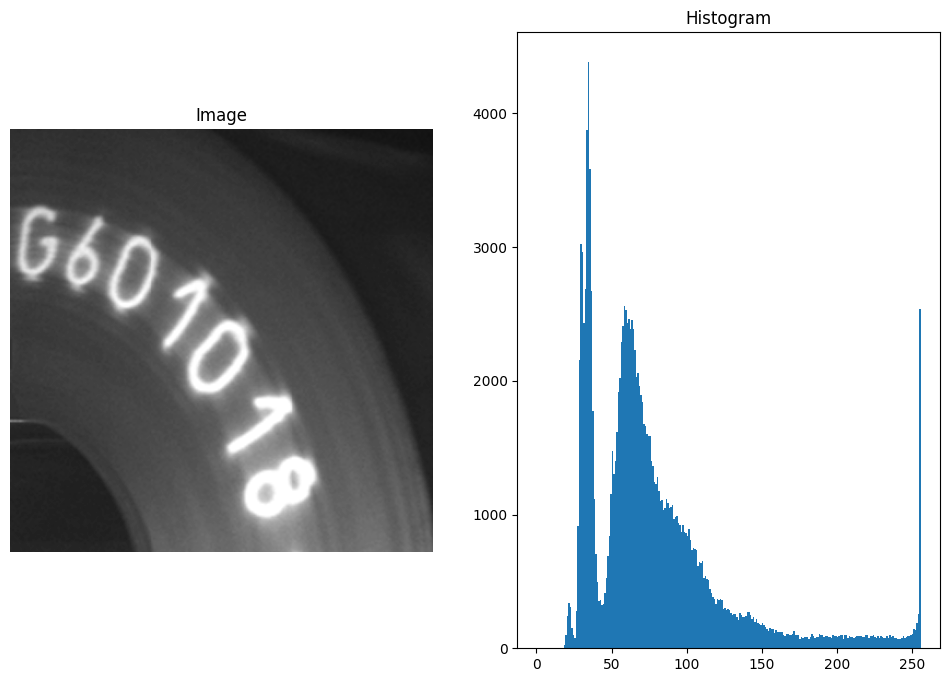

In [235]:
# Second image
name_img = "image"

# Get img_read an array
im_read, array_im = get_img(path_img = imagenes_[name_img])
array_im = del_channel(array_im)
min_value = min(array_im.shape)
array_im = resize_nearest_neighbor(array_im, min_value, min_value)

plotImageHist(array_im, hist = True)

10. I apply the homomorphic filter and conduct logAbout tests to verify if the results are comparable to the first image.

In [236]:
# Homomorphic filter
img_filtered_2 = hmm_filter(array_im, 1.2, 0.8, 1, 80, validate_axis = False)
# logAbout with c = 0.8
img_final_21 = logAbout_fromPaper(array_im, 0.8)
# LogAbout wit c = 5
img_final_22 = logAbout_fromPaper(array_im, 5)

C:\Users\edavi\AppData\Local\Temp\ipykernel_43384\2804123708.py:17: RuntimeWarning: divide by zero encountered in log
  loga = c * np.log(img_correction)
C:\Users\edavi\AppData\Local\Temp\ipykernel_43384\2804123708.py:21: RuntimeWarning: invalid value encountered in cast
  img_final = np.uint8(loga/max_val * 255)


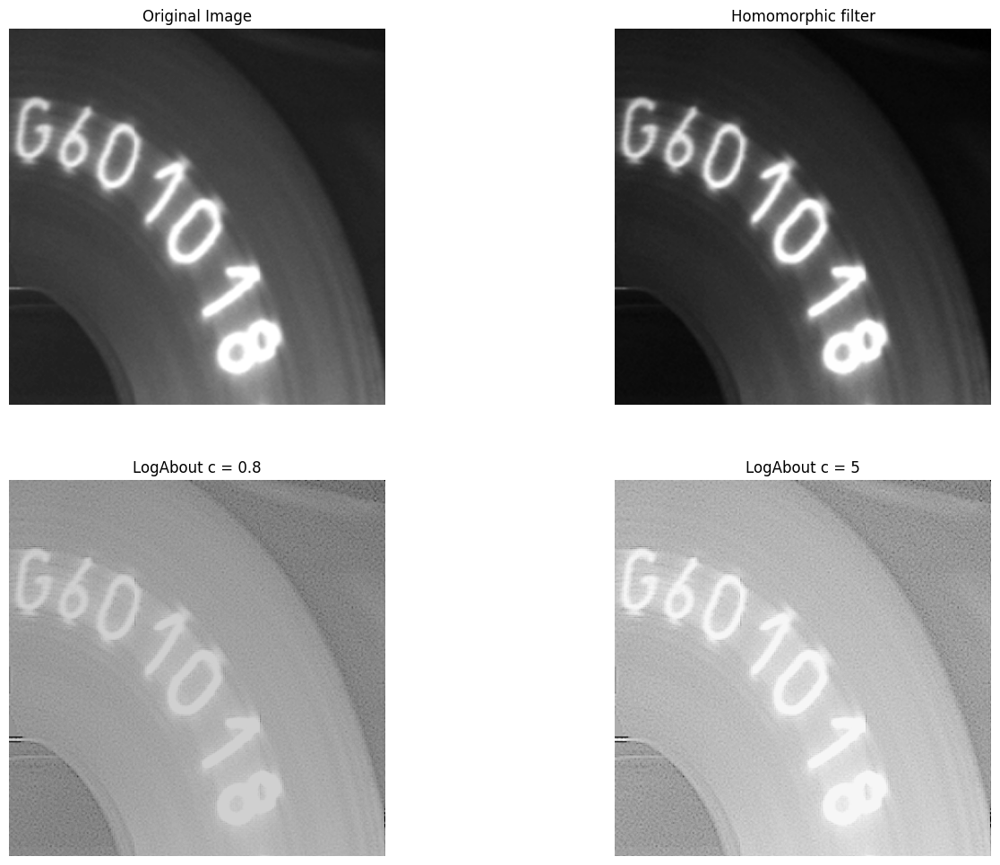

In [237]:
plotImages(
    [array_im, img_filtered_2, img_final_21, img_final_22],
    cant_imgs = 4,
    list_title=[
        "Original Image", "Homomorphic filter", "LogAbout c = 0.8", "LogAbout c = 5"])

**Analysis:** This method, as specified in the paper, is used as a preliminary step for face detection. By using similar methods, certain features of an image are sought to be established. In the case of these 2 images used in this point, we observe that both the homomorphic filter and the logAbout emphasize the values related to the contours and perform illumination correction of the image. In the case of the homomorphic filter, it is somewhat more computationally intensive, whereas method 2 can be more agile, but the results can be visibly quite different. In the case of the first image, we can observe that it better detects the contours of the stones in the image.

#### **Sixth activity**:
Apply to image Fig5.26(a).jpg the blur of Example 5.10 the textbook (3rd edition). Use the Wiener filtering and inverse filtering to try to recover the image. Calculate the PSNR of the recovered images, present them, and comment on
methodologies and results. Do again the same procedure, add a Gaussian noise of zero mean and variance of 100 to the image AFTER applying blur.

PSNR (Peak Signal to Noise Ratio) is computed using:
where

I(i, j) and K(i, j) are the original and corrupted images, respectively, and MAX is the highest gray level value of the original image. Use log10 to calculate PSNR.

1. Primero visualizamos la imagen ue se va a procecsar, eliminando los canales extra y validando si la matriz es procesable.

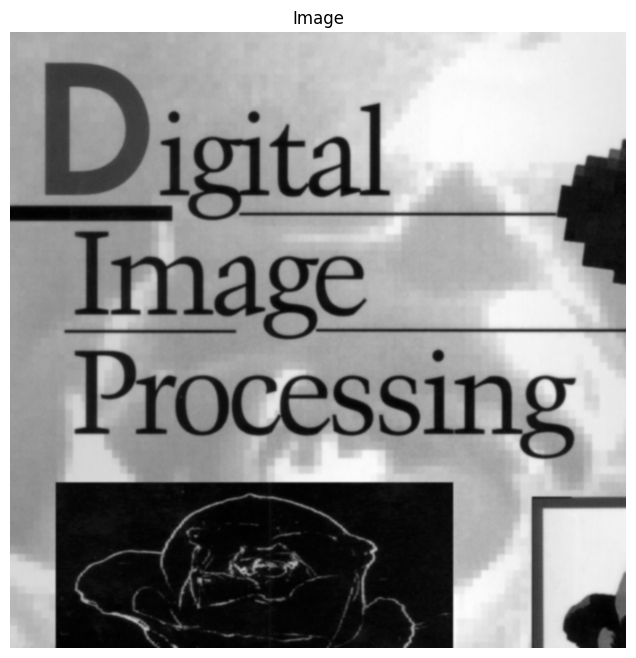

In [238]:
# imaage name
name_img = "Fig5"

# Get img_read an array
im_read, array_im = get_img(path_img = imagenes_[name_img])
array_im = del_channel(array_im)
plotImageHist(im_read, hist = False)

2. The function that generates the noise as requested in the reference book is created. The function `createH_noiseFilter` follows the steps given in the reference book and creates a matrix H, which will be applied to the image f in the frequency domain to add the filter. The input parameters of the function are:
- `org_dim`: Corresponds to the dimensions (width and height) of the original image.
  - `type`: tuple[2]
- `a`: Value requested in the function from the book.
  - `type`: float
- `b`: Value requested in the function from the book.
  - `type`: float
- `T`: Value requested in the function from the book.
  - `type`: int

In [239]:
# H generate function
def createH_noiseFilter(org_dim, a = 0.1, b = 0.1, T = 1):
    M, N = org_dim

    # Zero final matriz
    H = np.zeros((M, N), dtype = 'complex')

    # Center Value
    c_M, c_N = M//2, N//2
    # loop for x and y coordenates
    for u in range(M):
        for v in range(N):
            val_x = (u - c_M)
            val_y = (v - c_N)
            UAVB = val_x * a + val_y * b
            try:
                H[u, v] = ((T / (np.pi * UAVB)) * np.sin( np.pi * UAVB) * np.exp( -1j * np.pi * UAVB))
            except:
                H[u, v] = 1
    return H

3. Following this, and using the steps to perform the Fourier transform of the matrix of an image, a function is created that performs the processing of F(i, j) * (-1^(i+j)), his name as `inv_matrix` and another function that performs the normalization of the input image, `normalization_img`.

In [240]:
def inv_matrix(matrix):
    M, N = matrix.shape
    # output matrix
    F_ = np.zeros((M, N))
    # loop of products
    for i in range(M):
        for j in range(N):
            F_[i, j] = matrix[i, j] * ((-1) ** (i + j))
    return F_

def normalization_img(img):
    img_ = (img - np.min(img)) / (np.max(img) - np.min(img)) * 255
    # pass from float to uint8
    img_out = np.uint8(img_)
    return img_out

4. The processing is performed: first, the Fourier transform of the original image is calculated, the product of F*H is generated, and the inverse transform is performed to obtain the image with noise as in the book.

In [241]:
# Extraction of dimensions  
dim_F = array_im.shape

# Calculation of H  
H = createH_noiseFilter(dim_F)

# Calculation of Fourier transform of the original image  
# # Calculation of negatives  
F_ = inv_matrix(array_im)

# Fast Fourier transform  
F_fft = np.fft.fft2(F_)

# Convolution between frequencies  
G = H * F_fft

# Real output  
img_fin = np.real(
    np.fft.ifft2(G)
)

# Inverse
img_Final_ = normalization_img(inv_matrix(img_fin))

5. The result of the addition of noise is shown.

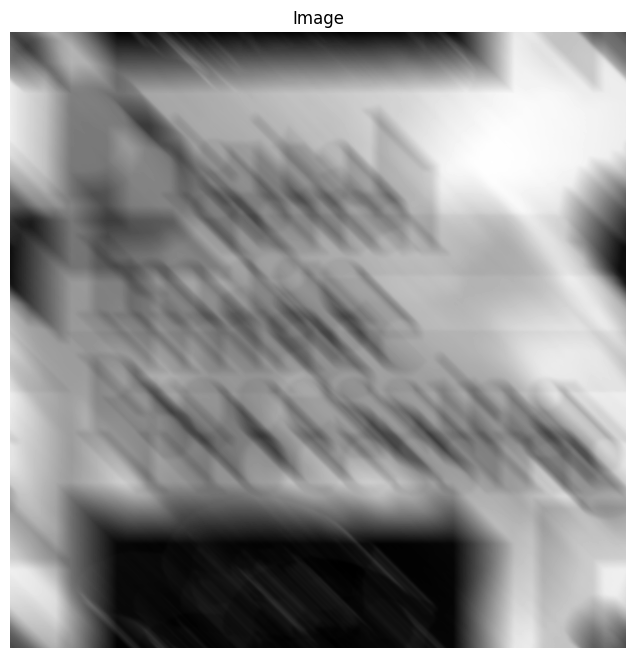

In [242]:
plotImageHist(img_Final_, hist = False)

6. Taking this new noisy image as the image to be recovered, the Fourier transform is performed to obtain its F(i, j).

In [243]:
# The matrix preparation steps are performed.  
# Calculation of negatives.  
F_ = inv_matrix(img_Final_)

# Fast Fourier transform.
F_fft = np.fft.fft2(F_)

7. The Wiener filter function is created as requested in the current activity. This function, named `fun_wienerF`, has the following input parameters:
- `H`: It corresponds to the matrix of the function H with which the noise was created.
  - `type`: np.ndarray[]
- `K`: It corresponds to a value necessary for the calculation of the function.
  - `type`: float

In [244]:
# Wiener filter attempt  
def funcion_wienerF(H, K = 0.01):
    # First, the values of the complex conjugate and abs are established.  
    H_conj = np.conjugate(H)
    # SSecond, the abs.  
    H_abs = np.abs(H) ** 2

    # Finally, the calculation is performed.
    Filtro_W = (1 / H) * (H_abs / (H_abs + K))

    return Filtro_W

8. The inverse filter is applied as specified in the reference book, then (storing in another variable) the Wiener filter is applied, and the obtained results are compared.

In [245]:
# Matrix preparation steps are performed  
# Negative calculation  
F_ = inv_matrix(img_Final_)

# Fast Fourier transform  
F_fft = np.fft.fft2(F_)

# Inverse filter attempt  
# First, the values of H are changed to center  
new_H = H.copy()
new_H[(new_H > -0.001) & (new_H < 0.001)] = 1

#Application of filter H  
a = 1 /  new_H
Inv_G = a * F_fft

# Final  
inv_G_ = np.real(
    np.fft.ifft2(Inv_G)
)

# Final processing  
img_G_Final = normalization_img(inv_matrix(inv_G_))

# Convolution of frequencies  
# Wiener filter  
F_w = funcion_wienerF(H, 0.001)

result = F_w * F_fft

# Final  
im_f = np.real(
    np.fft.ifft2(result)
)

# Final processing
img_Final = normalization_img(inv_matrix(im_f))

In [246]:
# Function for plot many images
def plotImages_2(img: list, cant_imgs: int = 2, list_title: list = ["original", "comparacion"], num_cols = 2) -> None:
    val_im = 0
    cant_rows = cant_imgs//num_cols
    fig, ax_s = plt.subplots(nrows = cant_rows, ncols = num_cols, figsize = (16, 12))
    if cant_rows == 1:
        for i in range(cant_imgs):
            ax_s[i].imshow(np.uint8(img[i]), cmap='gray', vmin=0, vmax=255)
            ax_s[i].set_title(list_title[i])
            ax_s[i].axis('off')
    else:
        for i in range(cant_rows):
            for j in range(num_cols):
                ax_s[i][j].imshow(np.uint8(img[val_im]), cmap='gray', vmin=0, vmax=255)
                ax_s[i][j].set_title(list_title[val_im])
                ax_s[i][j].axis('off')
                val_im+=1
    return None

9. We visualize the obtained data.


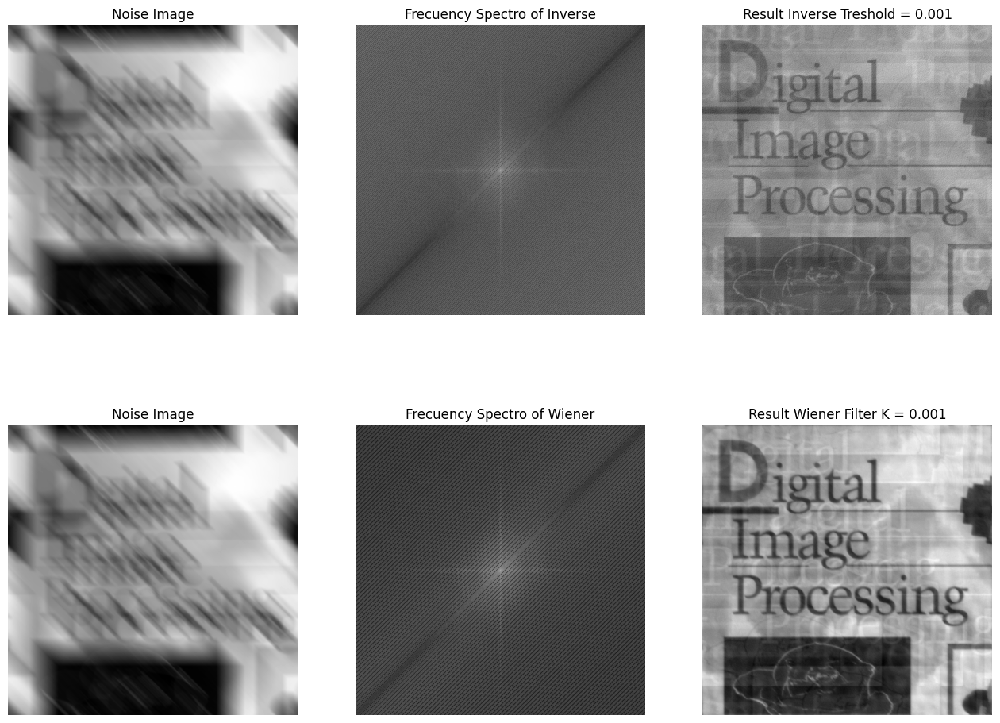

In [247]:
plotImages_2(
    [img_Final_, 10*np.log(np.abs(Inv_G) + 1), img_G_Final,
     img_Final_, 10*np.log(np.abs(result) + 1), img_Final],
     6,
     ["Noise Image", "Frecuency Spectro of Inverse", "Result Inverse Treshold = 0.001",
      "Noise Image", "Frecuency Spectro of Wiener", "Result Wiener Filter K = 0.001"],
    3
)

10. Following the process of the point, the PSNR is evaluated using the presented equation. For this task, the `psnr_function` is created, where the equation is applied considering an original image (noise-free image) and the corrupted image. This function aims to calculate the ratio between the maximum possible power of a signal and the power of the noise affecting the fidelity of its representation. It is commonly used to measure the quality of an image reconstruction or compression compared to the original image.

In [248]:
# Calculation of Peak Signal-to-Noise Ratio  
def psnr_function(original_img, corrupted_img, type_c = 0):
    M, N = original_img.shape
    # MAX, highest value from original image  
    max_gValue = original_img.max()
    # MSE_matrix zeros values  
    mse_m = 0.0
    # Calculation of MSE  
    for i in range(M):
        for j in range(N):
            #print(original_img[i, j], corrupted_img[i, j])
            mse_m += (float(original_img[i, j]) - float(corrupted_img[i, j])) ** 2
    # MSE calculation  
    mse_m = (1 / (M*N)) * mse_m

    # Type of evaluation  
    if type_c == 0:
        # Calculation of log 10  with cuadratic
        final = 10 * np.log10((max_gValue**2) / mse_m)
    else:
        # Calculation of log 10
        final = 20 * np.log10(max_gValue / mse_m)

    return final

In [249]:
# Inverse filter psnr calculate
psnr_filtroInv = round(psnr_function(array_im, img_G_Final), 2)
# Wiener filter psnr calculate
psnr_filtroW = round(psnr_function(array_im, img_Final), 2)
print("According to the calculation performed, the obtained PSNR values for the images are:")
print(f"Inverse filter processing: {psnr_filtroInv} dB")
print(f"Wiener filter processing: {psnr_filtroW} dB")

According to the calculation performed, the obtained PSNR values for the images are:
Inverse filter processing: 12.97 dB
Wiener filter processing: 18.96 dB


**Analysis:** If we calculate the `PSNR` of the original image and the resulting image from the filters, we observe that the obtained value is low on a scale of 0 to 100. However, the response of the Wiener filter for noise extraction from the image has a better result than the inverse filter. This may be due to, as expressed in the reference book, errors that occur when applying the inverse filter, possibly due to information lost during processing.

11. Continuing with the sequence of the point, a function `add_GaussianNoise` is created, which adds Gaussian noise to the image already with motion blur, taking into account the specifications of the requested noise.

In [250]:
# Now we add the Gaussian noise  
def add_GaussianNoise(img, mean = 0, varianza = 100, z = 1):
    # Output matrix  
    m_out = img.copy()
    M, N = m_out.shape

    des_std = np.sqrt(varianza)
    # Generation of Gaussian noise  
    noise = np.random.normal(mean, des_std, (M, N))

    # Add the noise  
    m_out = m_out + noise

    # Normalization  
    m_out = np.clip(m_out, 0, 255)

    m_out = m_out

    return m_out

12. Noise is added, and the same procedure of Fourier transform calculation and application of inverse and Wiener filters is applied.

In [251]:
# Adding Gaussian Noise
img_ruido_G = add_GaussianNoise(img_Final_, 0, 100)

# First, we apply the inverse filter  
# Calculation of negatives  
F_ = inv_matrix(img_ruido_G)

# Fast Fourier transform  
F_fft = np.fft.fft2(F_)

# Inverse filter attempt  
# First, the values of H are changed to center  
new_H = H.copy()
new_H[(new_H > -0.01) & (new_H < 0.01)] = 1

# Application of filter H  
matrix_h = 1 /  new_H
Inv_G = matrix_h * F_fft

# Final  
inv_G_ = np.real(
    np.fft.ifft2(Inv_G)
)

# Final processing  
#img_G_Final = inv_matrix(inv_G_)
img_G_Final = normalization_img(
    inv_matrix(
        inv_G_
        )
)

# Convolution of frequencies  
# Wiener filter  
F_w = funcion_wienerF(H, 0.0099)

result = F_w * F_fft

# Final  
im_f = np.real(
    np.fft.ifft2(result)
)

# Final processing
img_Final = normalization_img(inv_matrix(im_f))

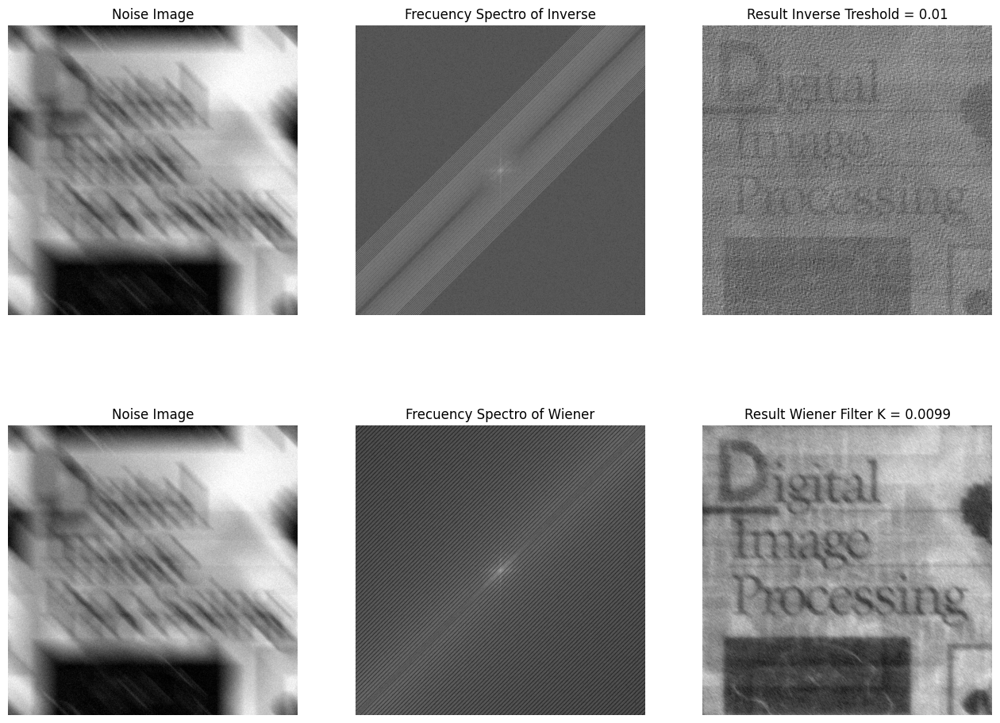

In [252]:
plotImages_2(
    [img_ruido_G, 10*np.log(np.abs(Inv_G) + 1), img_G_Final,
     img_ruido_G, 10*np.log(np.abs(result) + 1), img_Final],
     6,
     ["Noise Image", "Frecuency Spectro of Inverse", "Result Inverse Treshold = 0.01",
      "Noise Image", "Frecuency Spectro of Wiener", "Result Wiener Filter K = 0.0099"],
    3
)

In [253]:
# Inverse filter psnr calculate
psnr_filtroInv = round(psnr_function(array_im, img_G_Final), 2)
# Wiener filter psnr calculate
psnr_filtroW = round(psnr_function(array_im, img_Final), 2)
print("According to the calculation performed, the obtained PSNR values for the images are:")
print(f"Inverse filter processing: {psnr_filtroInv} dB")
print(f"Wiener filter processing: {psnr_filtroW} dB")

According to the calculation performed, the obtained PSNR values for the images are:
Inverse filter processing: 10.22 dB
Wiener filter processing: 15.14 dB


**Analysis:** In this case, the use of Gaussian noise significantly affects the performance of the inverse and Wiener filters, decreasing the PSNR calculation response by almost 5 points for both cases. The response is similar to that observed in the reference book, but even in that case, the Wiener filter has a much superior response to the inverse filter. This demonstrates that the inverse method is not as reliable when it comes to reconstructing images.

#### **Seventh Activity**:
Analyze the mit_noise_periodic.jpg image and propose a solution to reduce its distortions and noise. Compare with the image mit.jpg, before and after making the correction, calculating the PSNR (Peak Signal to Noise Ratio).

1. First, the image is displayed, then it is stored, and prepared for processing.

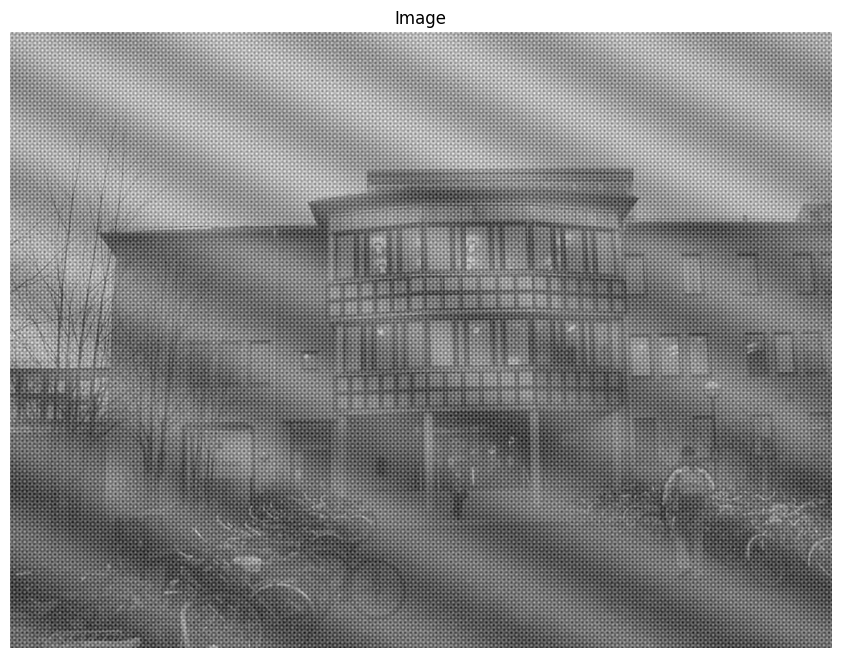

In [254]:
# Image name
name_img = "mit_noise_periodic"

# Get img_read an array
im_read, array_im = get_img(path_img = imagenes_[name_img])
array_im = del_channel(array_im)
plotImageHist(array_im, hist = False)

**Analysis:** We can observe that this image has two types of noise, two periodic noises that appear as shadows and textures in the actual image. It is important to reflect on the techniques mentioned in the reference book for processing this type of image. As a first step, we consider the application of a Butterworth low-pass filter, with a small distance from the central point, since the noise presented by the textures is common high-frequency noise, taking into account section **4.8** of the book

2. The Butterworth low-pass filter function is developed in the frequency domain, following the instructions from the reference book.

In [255]:
# Butterworth filter in the frequency domain
def buttFilter_fDom(img, d = 80, n_orden = 2):
    # Dimensions of the original image
    M, N = img.shape
    # Value x y 
    x = np.arange(M) - M // 2
    y = np.arange(N) - N // 2
    # Values X Y
    X, Y = np.meshgrid(x, y, sparse=False, indexing='ij')
    # Calculation of D
    D = np.sqrt(X**2 + Y**2)
    # Filter calculation
    filtro_out = 1 / (1 + (D / d)**(2 * n_orden))
    return filtro_out

3. Following this, processing is carried out in the frequency domain, similar to what was done in the previous step.

In [256]:
# First, we perform Fourier processing with the original image
# Calculation of negatives
F_ = inv_matrix(array_im)

# Fast Fourier Transform
F_fft = np.fft.fft2(F_)

# Frequency convolution
# butterworth
filtro_1 = buttFilter_fDom(array_im, 100, 2)

result = filtro_1 * F_fft

# First Process img
im_ret = np.real(
    np.fft.ifft2(result)
)

# Fist Processing Image
img_filterB = normalization_img(inv_matrix(im_ret))

**Analysis:** For the other type of noise, the noise that resembles shadows, a similar example is presented in section 5 of the reference book, where the noise near the center of the frequencies of the corrupted image is specified. For this, a kind of notch filter is applied to eliminate noise very specifically. To do this, the following function `notch_filter` is created, which removes noise points from a specific position with respect to the center.

In [257]:
# Notch filter application
def filtro_nocth(img, radio = 5, d1 = 30, d2  = 30, d3 = 30, d4 = 30):
    # Image dimensions
    P, Q = img.shape
    # Matrix center
    row_c, column_c = P // 2, Q // 2

    # Filter output matrix
    mat_filtro = np.ones((P, Q))

    # Filter creation cycles
    for i in range(P):
        for j in range(Q):
            if np.sqrt((i - row_c + d1) ** 2 + (j - column_c + d3) ** 2) < radio or np.sqrt((i - row_c - d2) ** 2 + (j - column_c - d4) ** 2) < radio:
                mat_filtro[i, j] = 0

    return mat_filtro

4. The filter is applied and added to the final result.

In [258]:
# Application of the second filter
filtro_2 = filtro_nocth(array_im, radio = 3, d1 = 8, d2 = 8, d3 = -5, d4 = -5)

result_2 = filtro_2 * result

# Final
im_f = np.real(
    np.fft.ifft2(result_2)
)

# Final processing
img_Final = normalization_img(inv_matrix(im_f))

5. The processing given with the corrupted image and the result after the analysis performed are visualized.

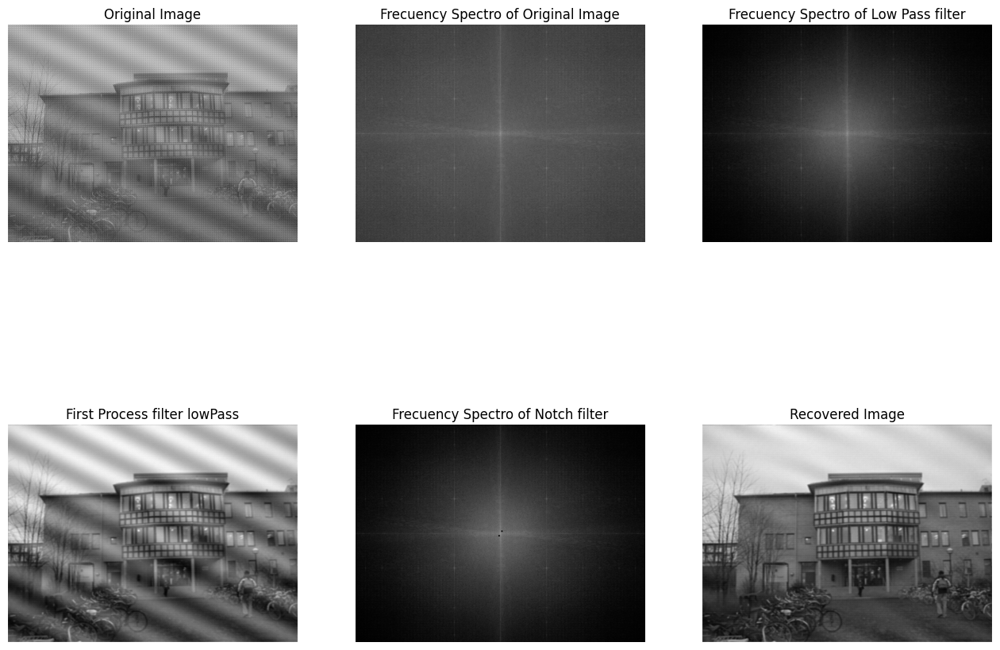

In [259]:
plotImages_2(
    [array_im, 10*np.log(np.abs(F_fft) + 1), 
     10*np.log(np.abs(result) + 1), img_filterB, 
     10*np.log(np.abs(result_2) + 1), img_Final],
     6,
     ["Original Image", "Frecuency Spectro of Original Image",
      "Frecuency Spectro of Low Pass filter", "First Process filter lowPass",
        "Frecuency Spectro of Notch filter", "Recovered Image"],
    3
)

6. Finally, the original image is loaded and displayed in order to calculate the PSNR of the two images and evaluate the quality of the filter.

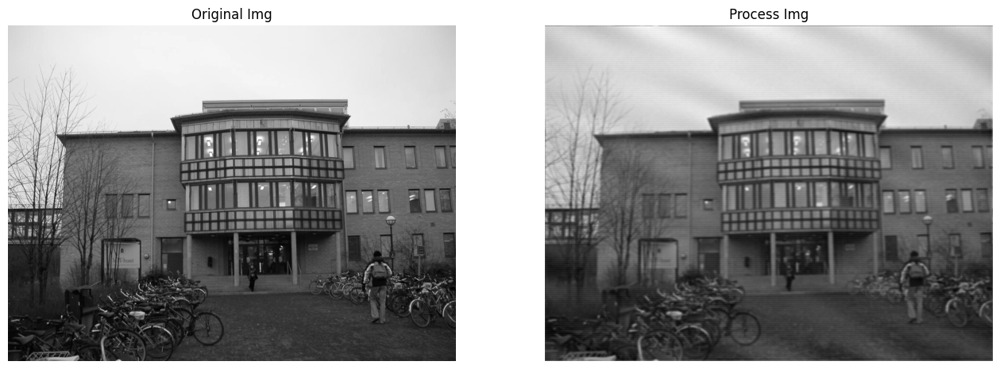

In [260]:
# Original without noise img
name_img = "mit"

# Get img_read an array
im_read_o, array_im_o = get_img(path_img = imagenes_[name_img])
array_im_o = del_channel(array_im_o)
plotImages(
    [array_im_o, img_Final],
    2,
    ["Original Img", "Process Img"]
)

In [261]:
# Original and recovered img calculate
psnr_filtroInv = round(psnr_function(array_im_o, img_Final), 2)
print("According to the calculation performed, the obtained PSNR values for the images are:")
print(f"Filter processing: {psnr_filtroInv} dB")

According to the calculation performed, the obtained PSNR values for the images are:
Filter processing: 22.35 dB


**Final Analysis:** We can observe that the procedure performed on the two proposed filters for image recovery yields a significantly good final result. This is demonstrated by the PSNR calculation, which indicates a much higher value compared to the values obtained previously by evaluating the original image and the recovered image. The performance of the filters could possibly be improved by combining the two into a single larger filter, in addition to applying a padding method to avoid losing information, as evidenced by the edges of the recovered image.